## General Context 

Nowadays, understanding the **purchasing patterns/behaviors of consumers** is a
key task for any retail company. Identifying the **relationships between the
different types of products, e.g, complementary, substitute, inferior and
convenience goods**, provides the company a wholistic view about its customers
and the portfolio of products it has to offer.

Specifically, market basket analysis is a data mining technique that is used
to inform a retailer about products that are frequently bought together, which
of these are seen as substitutes to one another and customer segmentation. The
retailer uses this information to then optimize the store's layout, develop
cross-promotional programs and develop different marketing strategies for its
customers.

## Business Situation 

Instacart is an american company that provides a grocery delivery and pick-up
service via a website or mobile app in the United States and Canada.

Within their platform, users can select items from a wide portfolio of
products, while allowing you to better manage your shopping by speaking with
the personal shopper assigned to you. **Your groceries are delivered to you the
same day they are ordered**. Jane Doe, one of Instacart's district managers,
described Instacart as follows:

> Whether you shop from meticulously planned grocery lists or let whimsy guide
> your grazing, our unique food rituals define who we are. Instacart, a
> grocery ordering and delivery app, aims to make it easy to fill your
> refrigerator and pantry with your personal favorites and staples when you
> need them. After selecting products through the Instacart app, personal
> shoppers review your order and do the in-store shopping and delivery for
> you.
 
Currently, Instacart uses **transactional data** to understand which products a
**user is likely to buy again, try for the first time, or add to their cart next
during a session**. Although, the lack of analytical capabilities hinders
Instacart's ability to take full advantage of this data. Due to the lack of
qualified in-house data scientists, Jane hired an external consultant to
some of the questions they've been struggling to address.

## Metadata

This dataset is a relational set of files describing customers' orders over
time. The dataset is anonymized and contains a sample of **200,000 grocery
orders from more than 100,000 Instacart users**. For each user, we provide a few
of their orders, with the sequence of products purchased in each order.
Because the original dataset was too large, the products were grouped by their
types, resulting in a total of **134 generalized products**.  We also provide the
week and hour of day the order was placed, and a relative measure of time
between orders.

## Business Goals

Aiming to provide an overview of Instacart's business as complete as
possible. 

- What are the **main types of consumer behavior** in the business?
- Which types of **products** should have an **extended amount of product offerings**?
- Which types of **products** can be seen as **substitutes**?
- Which **items** are **complementary**?

### Importing Packages

In [1]:

import warnings
warnings.filterwarnings("ignore")

#standard
import numpy as np
import pandas as pd
import datetime
import time
from math import ceil
from itertools import combinations

#math
import math
import scipy as sc


#visualization
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gspec

import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import graphviz
from tqdm import tqdm
import squarify

#Association Rules
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
import networkx as nx

import arulesviz

%config InlineBackend.figure_format = 'retina'

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\traittypes\traittypes.py:24: DeprecationWarning: 
            Sentinel is not a public part of the traitlets API.
            It was published by mistake, and may be removed in the future.
            
  """)


In [2]:
import logging

logging.getLogger('matplotlib.font_manager').disabled = True

#### Building dataset

In [3]:
dep = pd.read_csv(r'departments.csv')
products = pd.read_csv(r'products.csv')
ord_products = pd.read_csv(r'order_products.csv')
orders = pd.read_csv(r'orders.csv')

#### Complete dataset

In [4]:
orders = pd.merge(orders, ord_products, how='left', on='order_id')

In [5]:
semi_df = pd.merge(orders, products, how='left', on='product_id')

In [6]:
df = pd.merge(semi_df, dep, how='left', on='department_id')

In [7]:
df.to_csv(r'df.csv')

In [8]:
print('This dataset contains info relative to', len(df.user_id.unique()), 'customers!')

This dataset contains info relative to 105273 customers!


#### First contact

In [9]:
df.isna().sum()

order_id                       0
user_id                        0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    124342
product_id                     0
add_to_cart_order              0
reordered                      0
department_id                  0
product_name                   0
department                     0
dtype: int64

In [10]:
reordered_df = df[(df.reordered == 1)]
reordered_df.isna().sum()

order_id                  0
user_id                   0
order_number              0
order_dow                 0
order_hour_of_day         0
days_since_prior_order    0
product_id                0
add_to_cart_order         0
reordered                 0
department_id             0
product_name              0
department                0
dtype: int64

In [11]:
reordered_df

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,department_id,product_name,department
24,1201011,147243,14,0,16,3.0,83,3,1,4,fresh vegetables,produce
25,1201011,147243,14,0,16,3.0,24,4,1,4,fresh fruits,produce
26,1201011,147243,14,0,16,3.0,120,5,1,16,yogurt,dairy eggs
27,1201011,147243,14,0,16,3.0,120,6,1,16,yogurt,dairy eggs
28,1201011,147243,14,0,16,3.0,91,7,1,16,soy lactosefree,dairy eggs
...,...,...,...,...,...,...,...,...,...,...,...,...
2019490,3390742,199430,16,3,18,5.0,106,2,1,12,hot dogs bacon sausage,meat seafood
2019497,458285,128787,42,2,19,3.0,115,1,1,7,water seltzer sparkling water,beverages
2019498,458285,128787,42,2,19,3.0,32,2,1,4,packaged produce,produce
2019499,458285,128787,42,2,19,3.0,32,3,1,4,packaged produce,produce


In [12]:
df.department.unique()

array(['pantry', 'dairy eggs', 'produce', 'canned goods', 'meat seafood',
       'frozen', 'bakery', 'beverages', 'breakfast', 'snacks',
       'international', 'household', 'personal care', 'babies', 'deli',
       'dry goods pasta', 'missing', 'alcohol', 'pets', 'bulk', 'other'],
      dtype=object)

In [13]:
len(reordered_df.product_name.unique())

134

#### Missing Values

In [14]:
len(df[(df.days_since_prior_order.isna() == True) & (df.reordered == 0)])

124342

Makes sense, since a person that never reordered that product, doesnt have associated a previous order

In [15]:
df.days_since_prior_order.fillna(45, inplace = True)

In [16]:
df

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,department_id,product_name,department
0,2425083,49125,1,2,18,45.0,17,1,0,13,baking ingredients,pantry
1,2425083,49125,1,2,18,45.0,91,2,0,16,soy lactosefree,dairy eggs
2,2425083,49125,1,2,18,45.0,36,3,0,16,butter,dairy eggs
3,2425083,49125,1,2,18,45.0,83,4,0,4,fresh vegetables,produce
4,2425083,49125,1,2,18,45.0,83,5,0,4,fresh vegetables,produce
...,...,...,...,...,...,...,...,...,...,...,...,...
2019496,3390742,199430,16,3,18,5.0,83,8,0,4,fresh vegetables,produce
2019497,458285,128787,42,2,19,3.0,115,1,1,7,water seltzer sparkling water,beverages
2019498,458285,128787,42,2,19,3.0,32,2,1,4,packaged produce,produce
2019499,458285,128787,42,2,19,3.0,32,3,1,4,packaged produce,produce


#### Clusterization Process(1ºGoal)

Order ID is the invoice record where all the products need to be there.
- For example, Invoice No 1 --> (meat, cereais, productX, productY)

In [17]:
invoice_df = df[['order_id','product_name']]

In [18]:
print(len(df.product_name.unique()))

134


In [19]:
invoice_df

,order_id,product_name
0,2425083,baking ingredients
1,2425083,soy lactosefree
2,2425083,butter
3,2425083,fresh vegetables
4,2425083,fresh vegetables
...,...,...
2019496,3390742,fresh vegetables
2019497,458285,water seltzer sparkling water
2019498,458285,packaged produce
2019499,458285,packaged produce


### Most popular day of the week 

In [20]:
order_count = df.value_counts('order_dow').to_frame().reset_index()

In [21]:
order_count.rename({0: 'counts'},axis = 1, inplace = True)

In [22]:
order_count.rename({0:'Sunday',1:'Monday',2:'Tuesday',3:'Wednesday',4:'Thrusday',5:'Friday',6:'Saturday'}, axis = 0, inplace = True)

In [23]:
fig = go.Figure(data=[go.Pie(labels=order_count.index, values=order_count.counts, hole=.2)])
fig.show()

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



### Most popular time of the day to order

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\matplotlib_inline\config.py:68: DeprecationWarning:

InlineBackend._figure_format_changed is deprecated in traitlets 4.1: use @observe and @unobserve instead.



<AxesSubplot:>

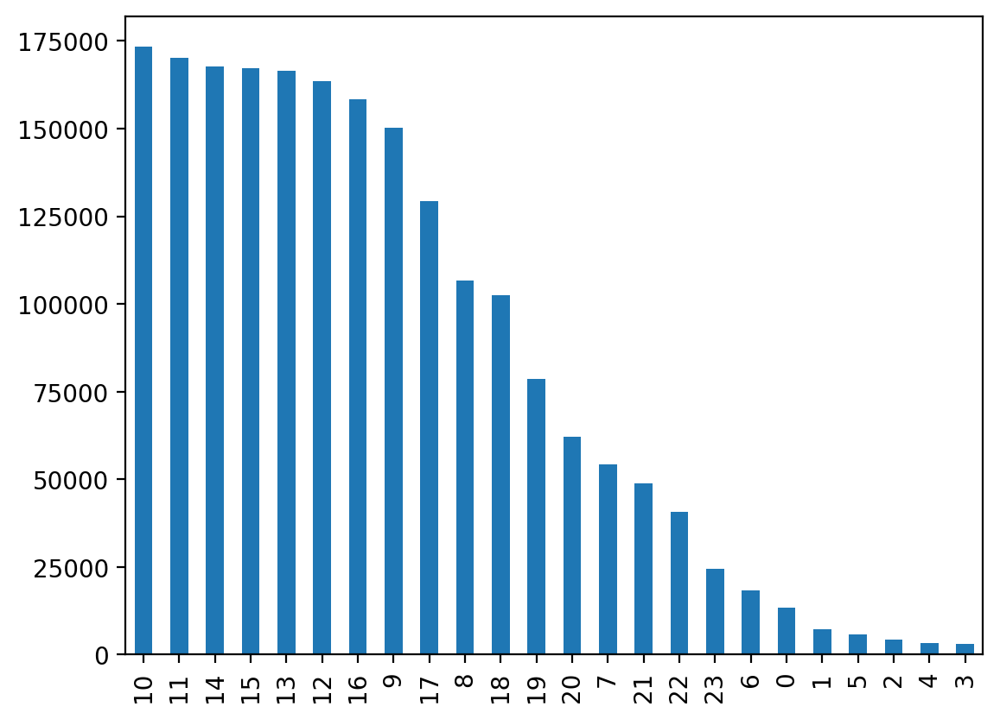

In [24]:
df['order_hour_of_day'].value_counts().head(24).plot(kind = 'bar')

In [25]:
hour_count = df.value_counts('order_hour_of_day').to_frame().reset_index()

In [26]:
hour_count.rename({0: 'counts'},axis = 1, inplace = True)

In [27]:
hour_count

,order_hour_of_day,counts
0,10,173306
1,11,170291
2,14,167831
3,15,167157
4,13,166376
5,12,163511
6,16,158247
7,9,150248
8,17,129383
9,8,106754


In [28]:
fig = px.bar(df, x=df.order_hour_of_day.unique(), y=df.value_counts('order_hour_of_day'),orientation='v',
             height=400,
             title='In which time of the day, Instacart has more demand?',
             labels={'x':'Hour', 'y': 'Orders received'})
fig.show()

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



#### Frequency Hist --> how many times an item/day/hour has occurred in our dataset as compared to the others

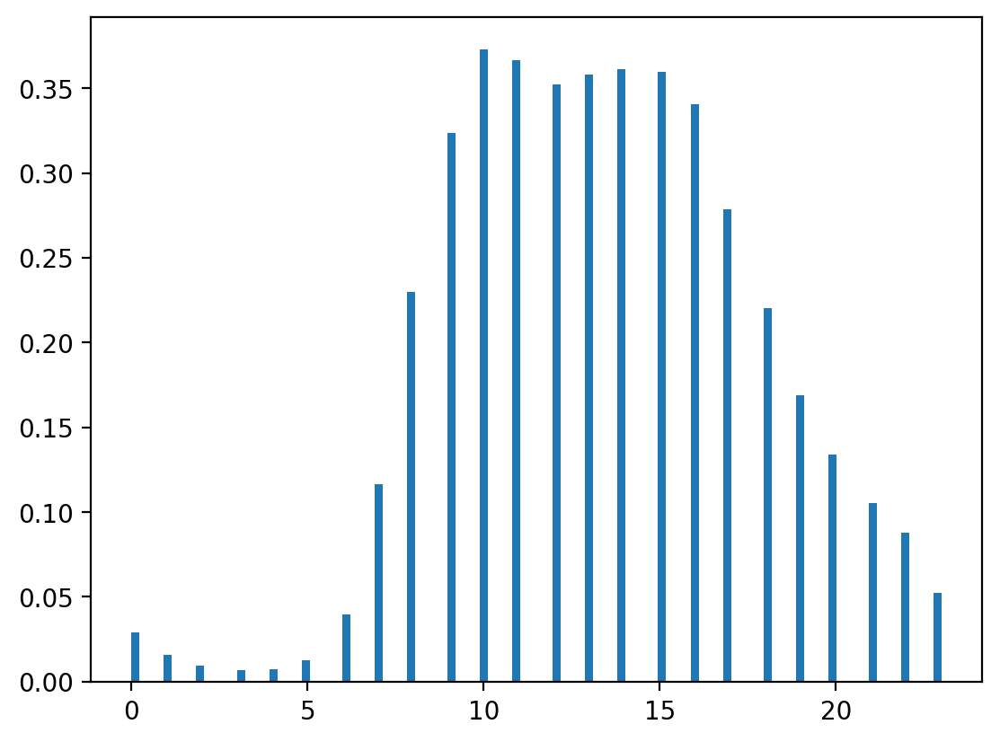

In [29]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.hist(df['order_hour_of_day'],bins=100,density=True);
plt.show()

### Days prior to next order

In [30]:
fig = px.scatter(df, x=df.days_since_prior_order.unique(), y=df.value_counts('days_since_prior_order'),
                 size=df.value_counts('days_since_prior_order'), color=df.value_counts('days_since_prior_order'),
                 log_x=False, size_max=60,
                 title='How many days customer usually need to order again?',
                 labels={'x':'Number of Days', 'y': 'Orders received'})
fig.show()


C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



### Most ordered products

Text(0.5, 0, 'Product Name')

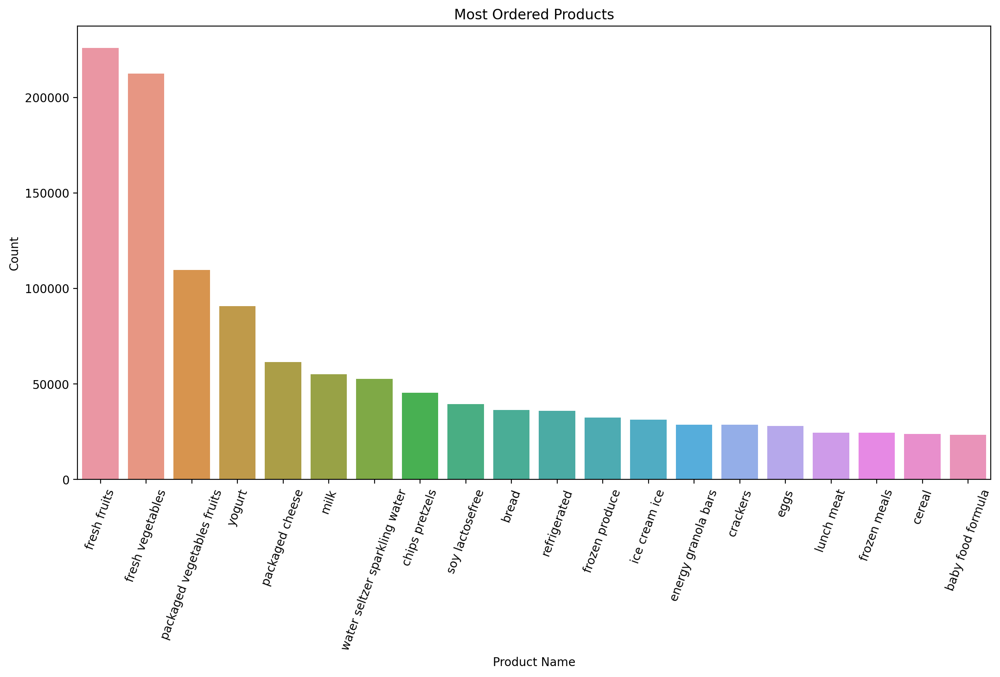

In [31]:
plt.figure(figsize = (14,7))
sns.countplot(x='product_name', data= invoice_df, 
              order = invoice_df.product_name.value_counts().index[:20])
plt.title('Most Ordered Products')
plt.xticks(rotation=70)
plt.ylabel('Count')
plt.xlabel('Product Name')
#plt.savefig("products")

In [32]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2, shared_yaxes=False,
                   subplot_titles=("Top 20 Products Demand", "Most Departments Ordered"))

fig.add_trace(go.Bar(x=invoice_df.product_name.unique(), y=invoice_df.product_name.value_counts()[0:20],
                     marker=dict(color=invoice_df.product_name.value_counts()[0:20], 
                                coloraxis="coloraxis1")),
              1, 1)

fig.add_trace(go.Bar(x=df.department.unique(), y=df.department.value_counts(),
                    marker=dict(color=df.department.value_counts(), 
                    coloraxis="coloraxis1")),
              1, 2)


#fig = go.Figure(data=traces, layout=layout)
fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=False)
fig.show()

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



### Most ordered Departments

Text(0.5, 0, 'Department')

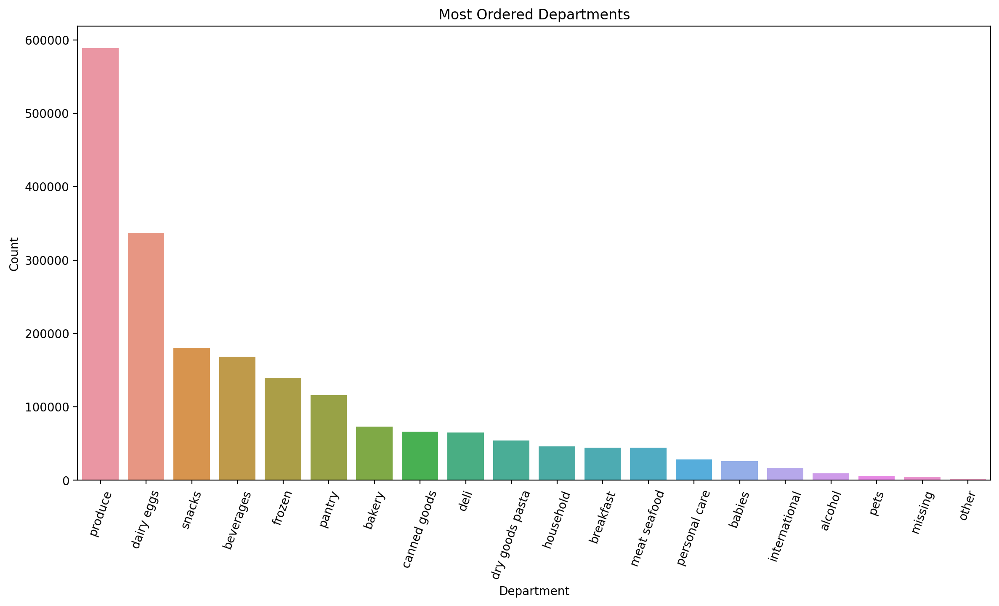

In [33]:
plt.figure(figsize = (14,7))
sns.countplot(x='department', data= df, order = df.department.value_counts().index[:20])
plt.title('Most Ordered Departments')
plt.xticks(rotation=70)
plt.ylabel('Count')
plt.xlabel('Department')
#plt.savefig("departments")

### Selecting Datasets for each day of the week

In [34]:
df_0 = df[(df.order_dow == 0)][['order_id','product_name']]
df_1 = df[(df.order_dow == 1)][['order_id','product_name']]
df_2 = df[(df.order_dow == 2)][['order_id','product_name']]
df_3 = df[(df.order_dow == 3)][['order_id','product_name']]
df_4 = df[(df.order_dow == 4)][['order_id','product_name']]
df_5 = df[(df.order_dow == 5)][['order_id','product_name']]
df_6 = df[(df.order_dow == 6)][['order_id','product_name']]

print(len(df_0))
print(len(df_1))
print(len(df_2))
print(len(df_3))
print(len(df_4))
print(len(df_5))
print(len(df_6))

391831
349236
261912
238730
234884
262157
280751


## Pivot

### Product View/Perspective

In [35]:
pivot = pd.pivot_table(invoice_df, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)
pivot.head()

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
order_id,,,,,,,,,,,,,,,,,,,,,
10,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
56,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Top 20 popular orders list

In [36]:
pivot.groupby(pivot.columns.tolist()).size().to_frame('count').reset_index().sort_values(by = 'count', ascending = False).head(20)

,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt,count
9179,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1463
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1330
5784,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,641
1505,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,557
9634,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,496
680,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,491
104,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,479
13657,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,468
9466,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,453
522,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,363


In [37]:
r = pivot.sum(axis=0).sort_values(ascending=False)[:20]

(0.0, 100.0, 0.0, 100.0)

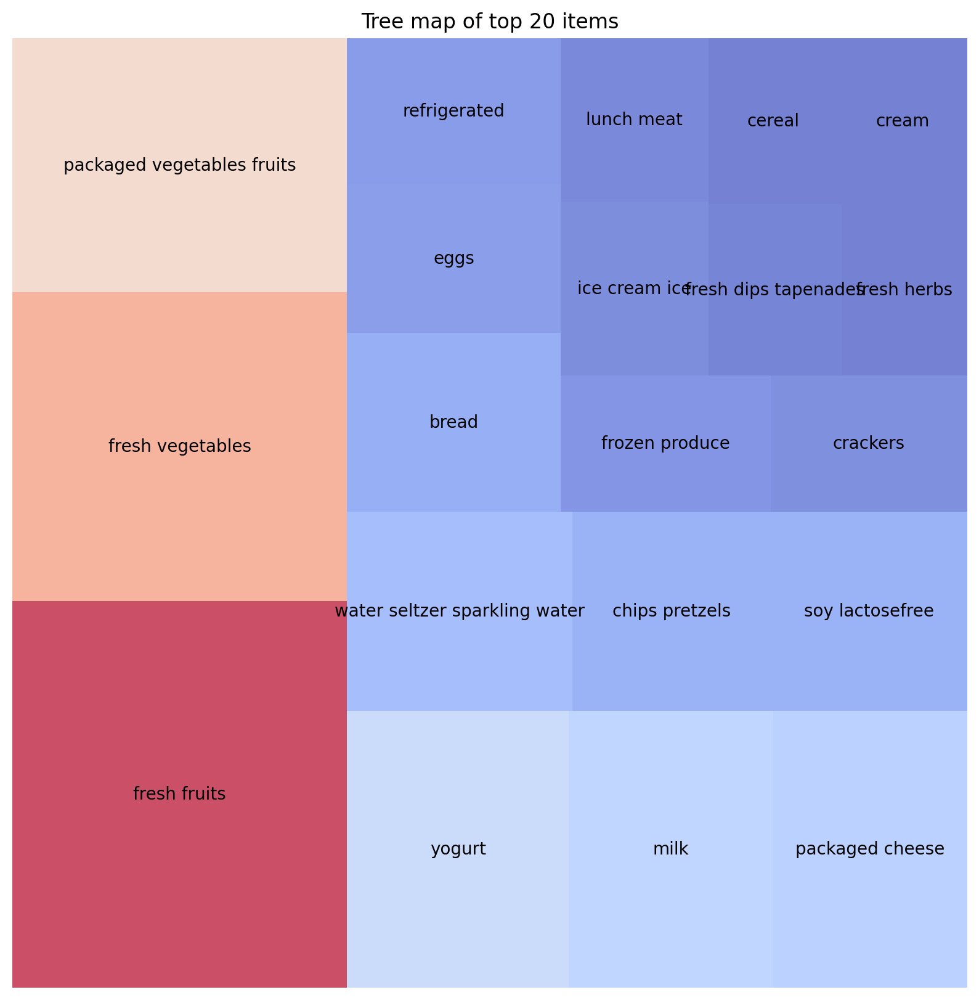

In [38]:
my_values=r.values
cmap = cm.coolwarm
mini=min(my_values)
maxi=max(my_values)
norm =  matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]

plt.figure(figsize=(10,10))
squarify.plot(sizes=r.values, label=r.index, alpha=.7,color=colors)
plt.title("Tree map of top 20 items")
plt.axis('off')

In [39]:
new_df = df[['order_id','product_name','department']]

In [40]:
product_count = new_df.value_counts('product_name').to_frame().reset_index()

In [41]:
products

,product_id,department_id,product_name
0,61,19,cookies cakes
1,104,13,spices seasonings
2,94,7,tea
3,38,1,frozen meals
4,5,13,marinades meat preparation
...,...,...,...
129,71,16,refrigerated pudding desserts
130,113,1,frozen juice
131,86,16,eggs
132,32,4,packaged produce


In [42]:
product_count

,product_name,0
0,fresh fruits,226039
1,fresh vegetables,212611
2,packaged vegetables fruits,109596
3,yogurt,90751
4,packaged cheese,61502
...,...,...
129,kitchen supplies,561
130,baby bath body care,515
131,baby accessories,504
132,beauty,387


In [43]:
t_df = pd.merge(product_count, products, how='left', on='product_name')
tree_df = pd.merge(t_df, dep, how='left', on='department_id')
tree_df.rename({0: 'counts'},axis = 1, inplace = True)

In [44]:
tree_df = tree_df[['product_name','department','counts']][:20]
tree_df["Instacart"] = "Instacart"

In [45]:
fig = px.treemap(tree_df, path=['Instacart','department', 'product_name'], values='counts',
                  color='department', hover_data=['product_name'],
                  color_continuous_scale='RdBu',
                )
fig.show()

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [46]:
pivot = pd.pivot_table(invoice_df, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)
pivot.head()

product_name,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
order_id,,,,,,,,,,,,,,,,,,,,,
10,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
56,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Day View

### Pivot table for each day of the week 

In [47]:
pivot_0 = pd.pivot_table(df_0, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

pivot_1 = pd.pivot_table(df_1, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

pivot_2 = pd.pivot_table(df_2, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

pivot_3 = pd.pivot_table(df_3, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

pivot_4 = pd.pivot_table(df_4, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

pivot_5 = pd.pivot_table(df_5, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

pivot_6 = pd.pivot_table(df_6, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)


## Generating Frequent Itemsets

{Diapers} -> {Beer} 
The {Diaper} is the **antecedent** and the {Beer} is the **consequent**. Both antecedents and consequents can have **multiple items**. In other words, {Diaper, Gum} -> {Beer, Chips} is a **valid rule**.

**Support** is the relative frequency that the rules show up. In many instances, you may want to **look for high support** in order to make sure it is a **useful relationship**. However, there may be instances where a **low** support is useful if you are trying to **find “hidden” relationships**. --> This measure gives an idea of how frequent an **itemset is in all the transactions**

Verificar low supp --> high conf

**Confidence** is a measure of the reliability of the rule. A confidence of **0.5** in the above example would mean that in 50% of the cases where Diaper and Gum were purchased, the purchase also included Beer and Chips. For product recommendation, a **50% confidence may be perfectly acceptable** but in a medical situation, this level may not be high enough. --> **Likeliness of occurrence of consequent** on the cart given that the cart **already has the antecedents**.

**Lift** is the ratio of the observed support to that expected if the two rules were independent. The **basic rule of thumb** is that a lift value **close to 1** means the rules were completely **independent**(the probability of occurrence of the **antecedent** and that of the **consequent** are independent of each other. When two events are independent of each other, no rule can be drawn involving those two events. ). Lift values **> 1** are generally more **“interesting” and could be indicative of a useful rule pattern**.(https://en.wikipedia.org/wiki/Lift_(data_mining))

**Lift** is the **rise in probability of having {Y} on the cart with the knowledge of {X} being present** over the probability of **having {Y}** on the cart **without any knowledge about presence of {X}**

Example: For example, suppose a population has an **average response rate** of 5%, but a certain model (or rule) has identified **a segment with a response rate of 20%**. Then that segment would have a **lift of 4.0 (20%/5%)**

The value of lift is that it considers **both the confidence of the rule and the overall data set**.(https://towardsdatascience.com/association-rules-2-aa9a77241654) 

**Leverage** is the **difference** between frequency of **antecedent and consequent together** in transactions to frequency of both in **independent transactions**.


**Conviction** translates that a **higher** score means that **consequent** is **highly dependent** on **antecedent**.

Following **Apriori Principle**, "All subsets of a frequent itemset must also be frequent" and so:

Using a minimum threshold for support in other to make it less computative expensive:

## Product View

In [48]:
frequent_itemsets = apriori(pivot, min_support=0.06, use_colnames=True)
frequent_itemsets

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.076635,(baking ingredients)
1,0.163865,(bread)
2,0.067765,(breakfast bakery)
3,0.074330,(butter)
4,0.069305,(candy chocolate)
...,...,...
103,0.081970,"(packaged cheese, fresh vegetables, packaged v..."
104,0.087995,"(fresh vegetables, yogurt, packaged vegetables..."
105,0.062535,"(fresh vegetables, milk, fresh fruits, package..."
106,0.068325,"(packaged cheese, fresh vegetables, fresh frui..."


In [49]:
rulesConfidence = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.30)
rulesConfidence.sort_values(by='confidence', ascending=False, inplace=True)

In [50]:
print('There are ',len(rulesConfidence), 'association rules!')

There are  153 association rules!


In [51]:
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

## Evaluating Association Rules Using Kulczynski and Imbalance Ratio

The use of **only support and confidence** measures to mine associations may generate a **large number of rules**, many of which can be **uninteresting to users**. Instead, it's important to **augment the support–confidence framework** with a **pattern interestingness measure**, which helps focus the mining toward rules with **trong pattern relationships**.

A measure is **null-invariant** if its value is **free from the influence of null-transactions** (i.e., the transactions that do not contain any of the itemsets being examined).

Therefore, it was decided to apply two metrics that are currently used (the **Kulczynski measure**,
together with the **imbalance ratio**), to present pattern relationships among itemsets. (Page 273 from Data Mining - Concepts and Techniques)

In [52]:
#https://libmunin.readthedocs.io/en/latest/_modules/munin/history.html

Kulczynski Measure for consistent rule correlation.
- "Data Mining - Concepts and Techniques" Page 268
- Its value is **only influenced** by the supports of A, B, and A ∪ B, or more exactly, by the conditional     probabilities of P(A|B) and P(B|A), but **not** by the **total number of transactions**. 
- Another common property is that each measure ranges from 0 to 1, and the **higher** the value, the
  **closer the relationship** between A and B


Imbalance Ratio of the Rule.
- [0, 1.0], lower is better.
- "Data Mining - Concepts and Techniques" Page 270
- if the two **directional implications** between A and B are the same, then IR(A, B) will
  be **zero**. Otherwise, the **larger the difference** between the two, the **larger the imbalance
  ratio**. 
- This ratio is **independent** of the number of **null-transactions** and independent of
  the **total number of transactions**

- Completely uninteresting rules would have both Kulczynski=0.5 and IR=0
- If Kulczynski is **near** 0 or 1, then we have an **interesting rule that is negatively or positively** associated respectively[https://stats.stackexchange.com/questions/151562/evaluating-association-rules-using-kulczynski-and-imbalance-ratio]

In [53]:
rulesConfidence['Kulc'] = (rulesConfidence['support'] / rulesConfidence['antecedent support'] + rulesConfidence['support'] / rulesConfidence['consequent support']) / 2

In [54]:
rulesConfidence['IR'] = abs((rulesConfidence['antecedent support'] - rulesConfidence['consequent support']) / 
                            (rulesConfidence['antecedent support'] + rulesConfidence['consequent support'] - rulesConfidence['support']))

In [55]:
rules = rulesConfidence[(rulesConfidence.IR < 0.2) & (rulesConfidence.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:20]

In [56]:
rulesConfidence.info

<bound method DataFrame.info of                                            antecedents  \
67                         (fresh herbs, fresh fruits)   
146  (fresh vegetables, yogurt, packaged vegetables...   
132  (fresh vegetables, milk, packaged vegetables f...   
27                                       (fresh herbs)   
139  (packaged cheese, fresh vegetables, packaged v...   
..                                                 ...   
120     (fresh vegetables, packaged vegetables fruits)   
103                                             (milk)   
32                                  (fresh vegetables)   
111                                  (packaged cheese)   
122                                             (milk)   

                                        consequents  antecedent support  \
67                               (fresh vegetables)            0.070135   
146                                  (fresh fruits)            0.087995   
132                                  (fresh fr

In [57]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR
150,"(fresh vegetables, packaged vegetables fruits)","(yogurt, fresh fruits)",0.234555,0.188225,0.076240,0.325041,1.726875,0.032091,1.202703,0.365044,0.133693
151,"(yogurt, fresh fruits)","(fresh vegetables, packaged vegetables fruits)",0.188225,0.234555,0.076240,0.405047,1.726875,0.032091,1.286564,0.365044,0.133693
102,"(yogurt, fresh fruits)",(milk),0.188225,0.243325,0.074860,0.397716,1.634503,0.029060,1.256341,0.352685,0.154476
103,(milk),"(yogurt, fresh fruits)",0.243325,0.188225,0.074860,0.307654,1.634503,0.029060,1.172500,0.352685,0.154476
111,(packaged cheese),"(yogurt, fresh fruits)",0.230995,0.188225,0.070020,0.303123,1.610431,0.026541,1.164876,0.337563,0.122480
110,"(yogurt, fresh fruits)",(packaged cheese),0.188225,0.230995,0.070020,0.372002,1.610431,0.026541,1.224533,0.337563,0.122480
85,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.365415,0.317560,0.186580,0.510598,1.607877,0.070539,1.394435,0.549070,0.096405
80,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.317560,0.365415,0.186580,0.587543,1.607877,0.070539,1.538546,0.549070,0.096405
141,"(fresh vegetables, fresh fruits, packaged vege...",(packaged cheese),0.186580,0.230995,0.068325,0.366197,1.585302,0.025226,1.213318,0.330991,0.127173
125,"(fresh vegetables, packaged vegetables fruits)",(packaged cheese),0.234555,0.230995,0.081970,0.349470,1.512891,0.027789,1.182121,0.352163,0.009281


In [58]:
fig = px.scatter(rulesConfidence, x='support', y='confidence',size = 'lift',log_x=True, color = 'lift',hover_name = rulesConfidence.index)
fig.update_layout(title='Association Rules for InstaCart')
fig.show()

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [59]:
def rules_format(data):
    data = data.copy(deep=True)
    data['LHS'] = [','.join(list(x)) for x in data['antecedents']]
    data['RHS'] = [','.join(list(x)) for x in data['consequents']]
    # Remove duplicate if reversed rules
    data['sortedRow'] = [sorted([a,b]) for a,b in zip(data.LHS, data.RHS)]
    data['sortedRow'] = data['sortedRow'].astype(str)
    data.drop_duplicates(subset=['sortedRow'], inplace=True)
    # Plot
    data=data[:50]
    return data

In [60]:
def draw_graph(rules, rules_to_show):
    fig = plt.figure(figsize=(10, 10)) 
    G1 = nx.DiGraph()
    color_map=[]
    N = 50
    colors = np.random.rand(N)    
    strs=['R0', 'R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9','R10',
          'R11','R12', 'R13', 'R14', 'R15', 'R16', 'R17', 'R18', 'R19']

    for i in range(rules_to_show):
        G1.add_nodes_from(["R"+str(i)])
        for a in rules.iloc[i]['antecedents']:
            G1.add_nodes_from([a])
            G1.add_edge(a, "R"+str(i), color=colors[i] , weight = 2)
        for c in rules.iloc[i]['consequents']:
            G1.add_nodes_from([c])
            G1.add_edge("R"+str(i), c, color=colors[i],  weight=2)

    for node in G1:
        found_a_string = False
        for item in strs: 
            if node==item:
                found_a_string = True
        if found_a_string:
            color_map.append('yellow')
        else:
            color_map.append('green')       

    edges = G1.edges()
    colors = [G1[u][v]['color'] for u,v in edges]
    weights = [G1[u][v]['weight'] for u,v in edges]

    pos = nx.circular_layout(G1)
    nx.draw(G1, pos, labels=edges, node_color = color_map, edge_color=colors, width=weights, font_size=30, 
            with_labels=False)            

    nx.draw_networkx_labels(G1, pos)
    plt.show()

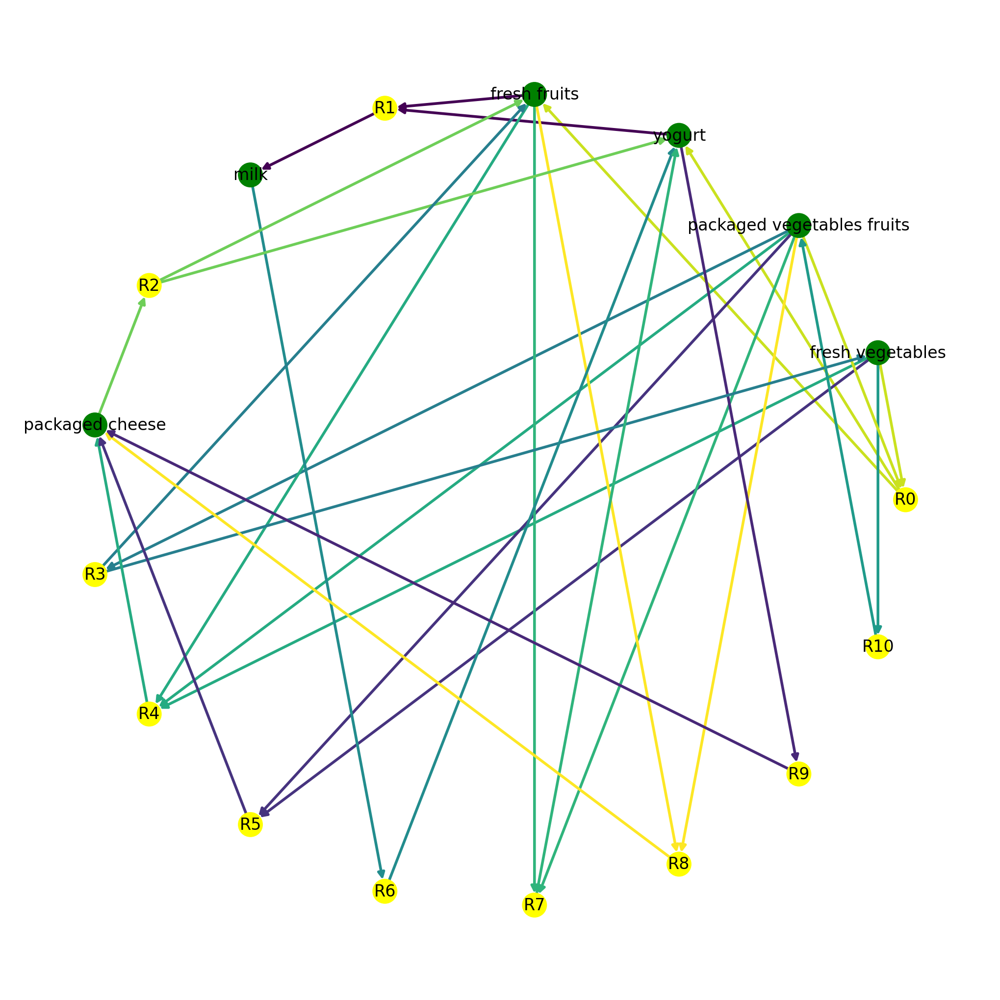

In [61]:
draw_graph(rules_format(rules),len(rules_format(rules)))

## Hidden Rules

In [62]:
hidden_product=rulesConfidence[(rulesConfidence.support < 0.06) & (rulesConfidence.IR < 0.3)]

In [63]:
hidden_product

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR


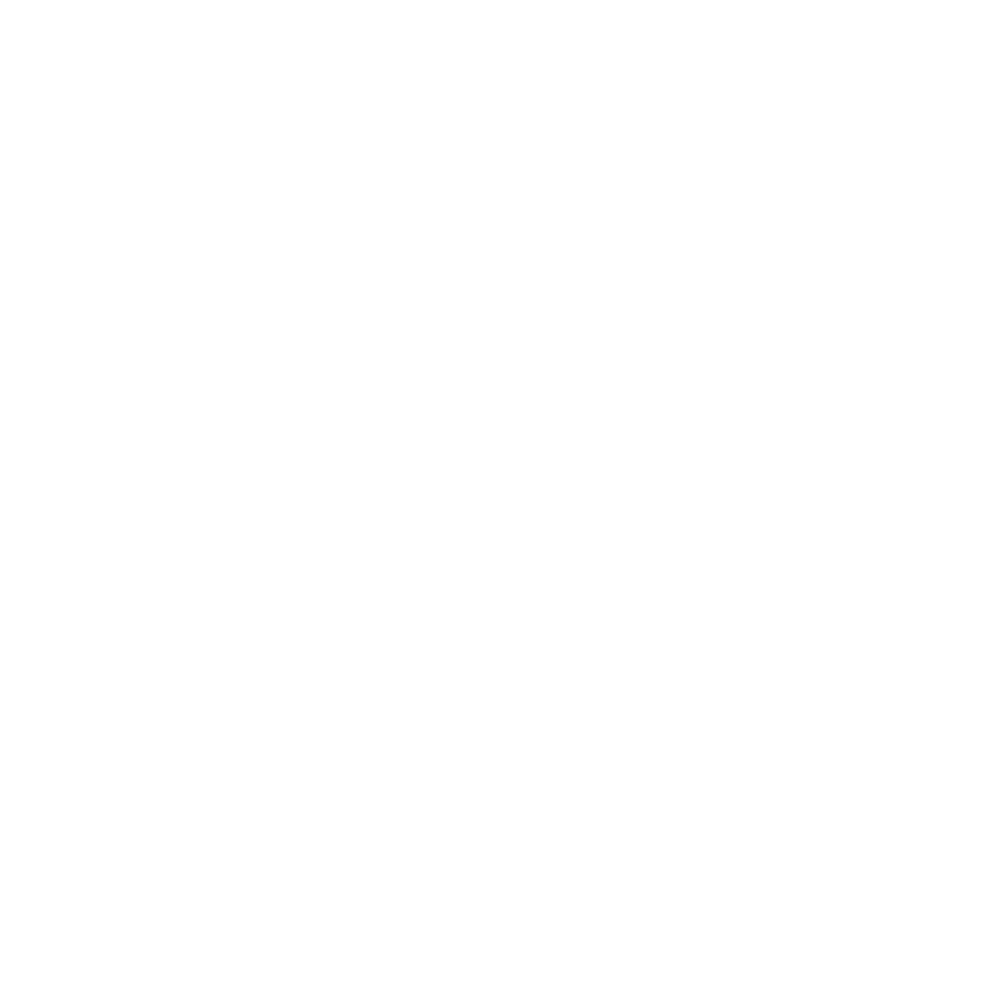

In [64]:
draw_graph(rules_format(hidden_product), len(rules_format(hidden_product)))

## DoW View

### Sunday

In [65]:
frequent_itemsets_0 = apriori(pivot_0, min_support=0.05, use_colnames=True)
frequent_itemsets_0

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.051428,(baby food formula)
1,0.080278,(baking ingredients)
2,0.186043,(bread)
3,0.071783,(breakfast bakery)
4,0.082844,(butter)
...,...,...
232,0.050459,"(water seltzer sparkling water, fresh vegetabl..."
233,0.102942,"(fresh vegetables, yogurt, fresh fruits, packa..."
234,0.057871,"(milk, yogurt, fresh fruits, packaged vegetabl..."
235,0.058612,"(packaged cheese, yogurt, fresh fruits, packag..."


In [66]:
# Generate the association rules - by confidence
rulesConfidence_0 = association_rules(frequent_itemsets_0, metric="confidence", min_threshold=0.30)
rulesConfidence_0['Day'] = 1

In [67]:
rulesConfidence_0.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence_0

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day
336,"(packaged vegetables fruits, fresh herbs, fres...",(fresh vegetables),0.057215,0.533981,0.053025,0.926756,1.735559,0.022473,6.362580,1
270,"(fresh herbs, packaged vegetables fruits)",(fresh vegetables),0.067592,0.533981,0.061834,0.914804,1.713176,0.025741,5.469951,1
185,"(fresh herbs, fresh fruits)",(fresh vegetables),0.089059,0.533981,0.080592,0.904930,1.694684,0.033036,4.901825,1
363,"(fresh vegetables, yogurt, milk)",(fresh fruits),0.073436,0.611266,0.065369,0.890140,1.456222,0.020479,3.538438,1
412,"(yogurt, milk, packaged vegetables fruits)",(fresh fruits),0.065169,0.611266,0.057871,0.888014,1.452745,0.018035,3.471270,1
...,...,...,...,...,...,...,...,...,...,...
156,(chips pretzels),"(yogurt, fresh fruits)",0.175865,0.224899,0.053766,0.305722,1.359377,0.014214,1.116414,1
106,(packaged vegetables fruits),(milk),0.427961,0.259222,0.130310,0.304490,1.174628,0.019373,1.065085,1
268,(soy lactosefree),"(yogurt, fresh fruits)",0.182593,0.224899,0.055419,0.303513,1.349553,0.014354,1.112872,1
111,(soy lactosefree),(packaged cheese),0.182593,0.266036,0.055391,0.303357,1.140286,0.006815,1.053573,1


In [68]:
rulesConfidence_0['Kulc'] = (rulesConfidence_0['support'] / rulesConfidence_0['antecedent support'] + rulesConfidence_0['support'] / rulesConfidence_0['consequent support']) / 2

In [69]:
rulesConfidence_0['IR'] = abs((rulesConfidence_0['antecedent support'] - rulesConfidence_0['consequent support']) / 
                            (rulesConfidence_0['antecedent support'] + rulesConfidence_0['consequent support'] - rulesConfidence_0['support']))

In [70]:
rules_0 = rulesConfidence_0[(rulesConfidence_0.IR < 0.2) & (rulesConfidence_0.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:10]

In [71]:
rules_0

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
432,"(packaged cheese, packaged vegetables fruits)","(fresh vegetables, yogurt)",0.143623,0.185871,0.052255,0.363835,1.957454,0.025560,1.279744,1,0.322485,0.152391
424,"(packaged cheese, fresh fruits)","(yogurt, packaged vegetables fruits)",0.189036,0.160300,0.058612,0.310059,1.934242,0.028310,1.217060,1,0.337850,0.098843
426,"(yogurt, packaged vegetables fruits)","(packaged cheese, fresh fruits)",0.160300,0.189036,0.058612,0.365641,1.934242,0.028310,1.278400,1,0.337850,0.098843
354,"(fresh vegetables, milk)","(packaged cheese, fresh fruits)",0.153829,0.189036,0.056075,0.364529,1.928360,0.026996,1.276163,1,0.330583,0.122763
416,"(milk, fresh fruits)","(yogurt, packaged vegetables fruits)",0.187782,0.160300,0.057871,0.308183,1.922539,0.027770,1.213760,1,0.334600,0.094695
418,"(yogurt, packaged vegetables fruits)","(milk, fresh fruits)",0.160300,0.187782,0.057871,0.361017,1.922539,0.027770,1.271112,1,0.334600,0.094695
386,"(packaged cheese, fresh fruits)","(fresh vegetables, yogurt)",0.189036,0.185871,0.066765,0.353190,1.900182,0.031629,1.258682,1,0.356196,0.010269
387,"(fresh vegetables, yogurt)","(packaged cheese, fresh fruits)",0.185871,0.189036,0.066765,0.359202,1.900182,0.031629,1.265554,1,0.356196,0.010269
370,"(milk, fresh fruits)","(fresh vegetables, yogurt)",0.187782,0.185871,0.065369,0.348110,1.872853,0.030465,1.248874,1,0.349899,0.006196
368,"(fresh vegetables, yogurt)","(milk, fresh fruits)",0.185871,0.187782,0.065369,0.351687,1.872853,0.030465,1.252819,1,0.349899,0.006196


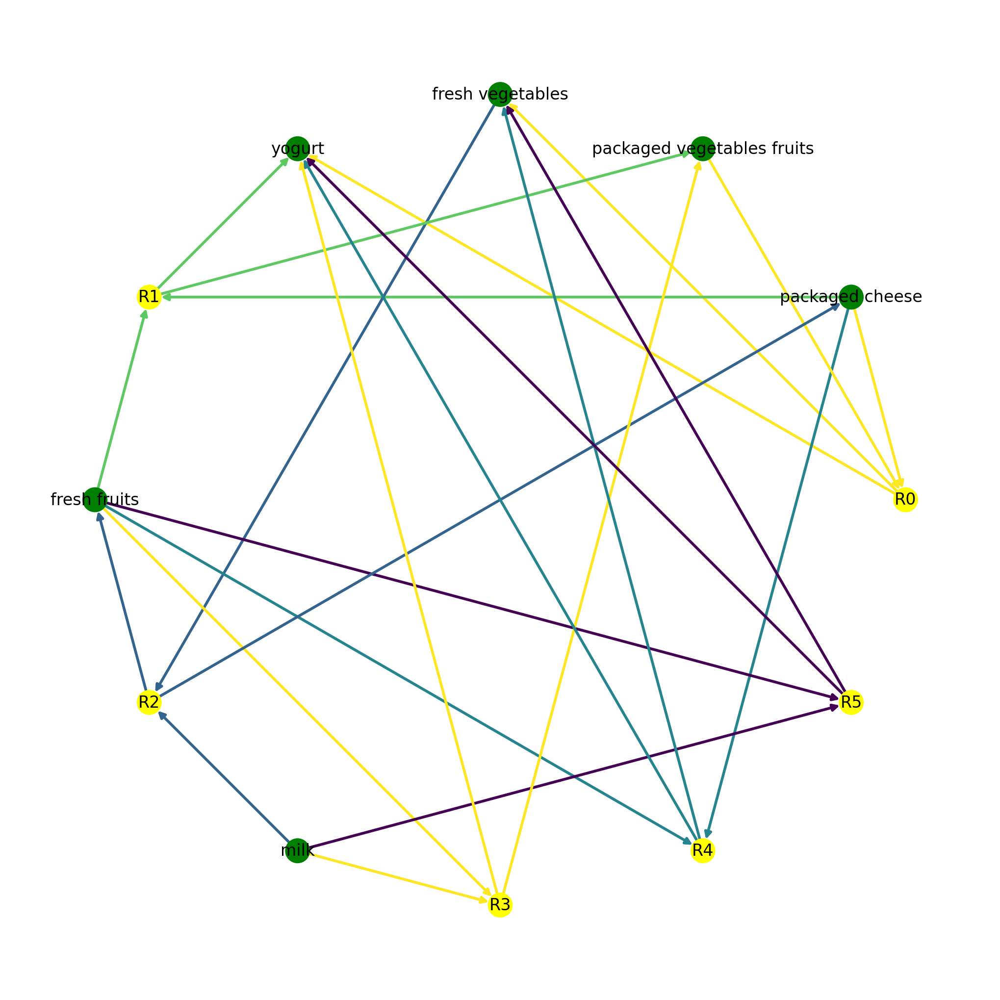

In [72]:
draw_graph(rules_format(rules_0), len(rules_format(rules_0)))

### Monday

In [73]:
frequent_itemsets_1 = apriori(pivot_1, min_support=0.05, use_colnames=True)
frequent_itemsets_1

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.069524,(baking ingredients)
1,0.162659,(bread)
2,0.069815,(breakfast bakery)
3,0.067311,(butter)
4,0.071882,(candy chocolate)
...,...,...
155,0.065797,"(fresh vegetables, milk, fresh fruits, package..."
156,0.050367,"(fresh vegetables, milk, yogurt, fresh fruits)"
157,0.068621,"(packaged cheese, fresh vegetables, fresh frui..."
158,0.051560,"(soy lactosefree, fresh vegetables, fresh frui..."


In [74]:
rulesConfidence_1 = association_rules(frequent_itemsets_1, metric="confidence", min_threshold=0.30)
rulesConfidence_1['Day'] = 2

In [75]:
rulesConfidence_1.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence_1

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day
108,"(fresh herbs, fresh fruits)",(fresh vegetables),0.066554,0.437929,0.059043,0.887139,2.025758,0.029897,4.980207,2
200,"(fresh vegetables, milk, packaged vegetables f...",(fresh fruits),0.075143,0.577821,0.065797,0.875630,1.515399,0.022378,3.394529,2
228,"(fresh vegetables, yogurt, packaged vegetables...",(fresh fruits),0.089758,0.577821,0.078229,0.871554,1.508345,0.026365,3.286812,2
206,"(fresh vegetables, yogurt, milk)",(fresh fruits),0.057791,0.577821,0.050367,0.871537,1.508315,0.016974,3.286373,2
222,"(fresh vegetables, packaged vegetables fruits,...",(fresh fruits),0.059479,0.577821,0.051560,0.866862,1.500226,0.017192,3.170998,2
...,...,...,...,...,...,...,...,...,...,...
69,(packaged vegetables fruits),(packaged cheese),0.373442,0.226476,0.114126,0.305605,1.349394,0.029550,1.113954,2
220,(packaged cheese),"(fresh vegetables, fresh fruits, packaged vege...",0.226476,0.192471,0.068621,0.302995,1.574237,0.025031,1.158570,2
175,(milk),"(fresh vegetables, packaged vegetables fruits)",0.248952,0.238587,0.075143,0.301836,1.265096,0.015746,1.090593,2
34,(fresh fruits),(milk),0.577821,0.248952,0.174246,0.301557,1.211306,0.030396,1.075318,2


In [76]:
rulesConfidence_1['Kulc'] = (rulesConfidence_1['support'] / rulesConfidence_1['antecedent support'] + rulesConfidence_1['support'] / rulesConfidence_1['consequent support']) / 2

In [77]:
rulesConfidence_1['IR'] = abs((rulesConfidence_1['antecedent support'] - rulesConfidence_1['consequent support']) / 
                            (rulesConfidence_1['antecedent support'] + rulesConfidence_1['consequent support'] - rulesConfidence_1['support']))

In [78]:
rules_1 = rulesConfidence_1[(rulesConfidence_1.IR < 0.2) & (rulesConfidence_1.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:10]

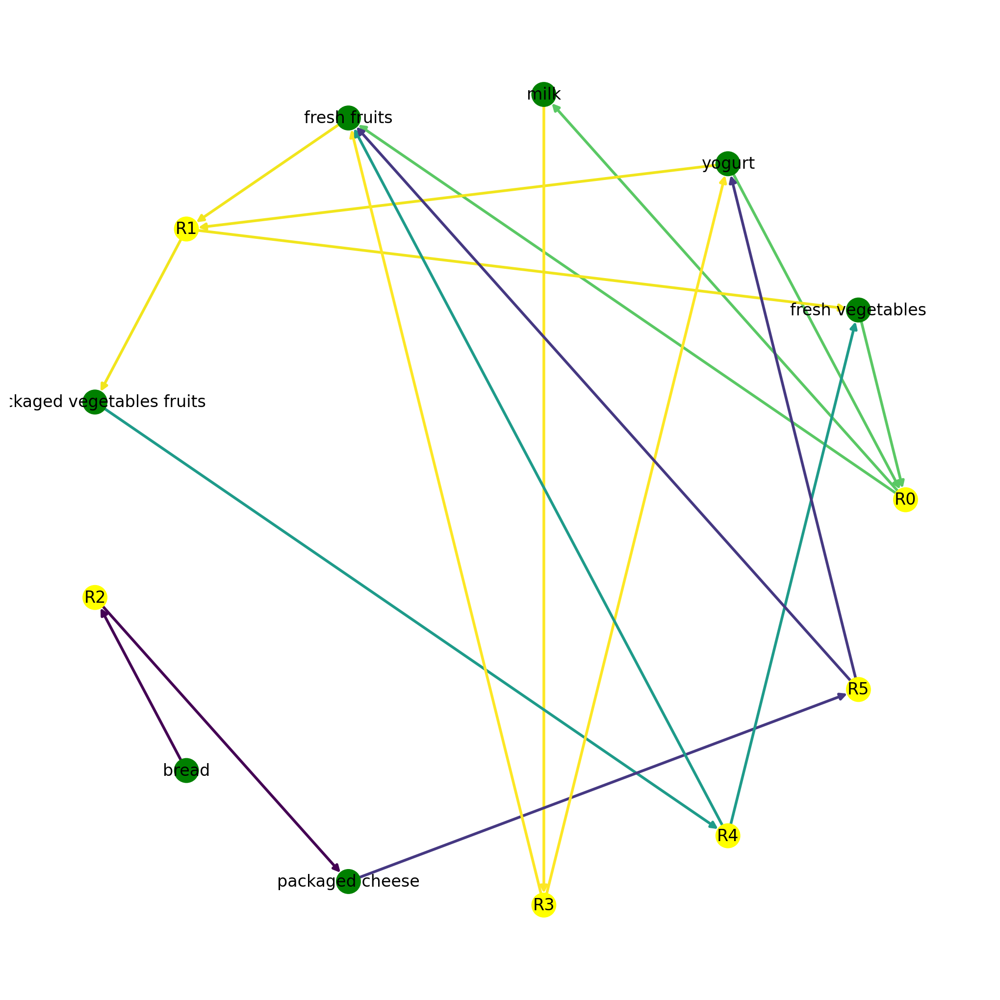

In [79]:
draw_graph(rules_format(rules_1), len(rules_format(rules_1)))

### Tuesday

In [80]:
frequent_itemsets_2 = apriori(pivot_2, min_support=0.05, use_colnames=True)

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



In [81]:
rulesConfidence_2 = association_rules(frequent_itemsets_2, metric="confidence", min_threshold=0.30)
rulesConfidence_2['Day'] = 3

In [82]:
rulesConfidence_2.sort_values(by='confidence', ascending=False, inplace=True)
rulesConfidence_2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day
83,"(fresh herbs, fresh fruits)",(fresh vegetables),0.060820,0.414892,0.052792,0.867993,2.092095,0.027558,4.432396,3
168,"(fresh vegetables, yogurt, packaged vegetables...",(fresh fruits),0.078528,0.527441,0.067126,0.854809,1.620672,0.025707,3.254733,3
154,"(fresh vegetables, milk, packaged vegetables f...",(fresh fruits),0.064010,0.527441,0.054295,0.848225,1.608189,0.020533,3.113542,3
40,(fresh herbs),(fresh vegetables),0.081827,0.414892,0.068153,0.832885,2.007477,0.034203,3.501238,3
161,"(packaged cheese, fresh vegetables, packaged v...",(fresh fruits),0.073468,0.527441,0.060784,0.827345,1.568603,0.022034,2.737020,3
...,...,...,...,...,...,...,...,...,...,...
172,"(fresh vegetables, packaged vegetables fruits)","(yogurt, fresh fruits)",0.214833,0.172526,0.067126,0.312457,1.811071,0.030062,1.203523,3
116,"(fresh fruits, packaged vegetables fruits)",(milk),0.248048,0.236316,0.077245,0.311410,1.317768,0.018627,1.109054,3
152,(yogurt),"(fresh vegetables, packaged vegetables fruits)",0.252814,0.214833,0.078528,0.310615,1.445843,0.024215,1.138938,3
89,"(fresh vegetables, fresh fruits)",(milk),0.289731,0.236316,0.089526,0.308997,1.307555,0.021058,1.105181,3


In [83]:
rulesConfidence_2['Kulc'] = (rulesConfidence_2['support'] / rulesConfidence_2['antecedent support'] + rulesConfidence_2['support'] / rulesConfidence_2['consequent support']) / 2

In [84]:
rulesConfidence_2['IR'] = abs((rulesConfidence_2['antecedent support'] - rulesConfidence_2['consequent support']) / 
                            (rulesConfidence_2['antecedent support'] + rulesConfidence_2['consequent support'] - rulesConfidence_2['support']))

In [85]:
rules_2 = rulesConfidence_2[(rulesConfidence_2.IR < 0.2) & (rulesConfidence_2.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:10]

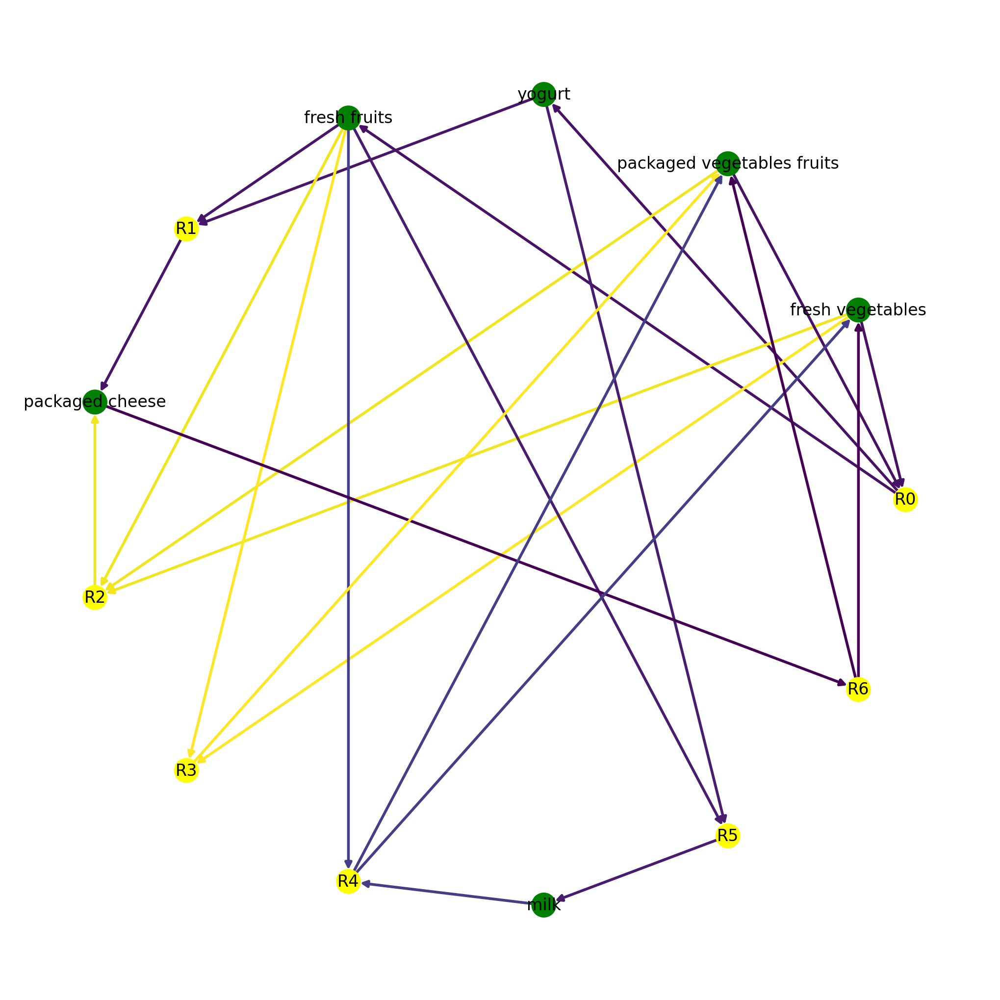

In [86]:
draw_graph(rules_format(rules_2), len(rules_format(rules_2)))

### Wednesday

In [87]:
frequent_itemsets_3 = apriori(pivot_3, min_support=0.05, use_colnames=True)


C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



In [88]:
rulesConfidence_3 = association_rules(frequent_itemsets_3, metric="confidence", min_threshold=0.30)
rulesConfidence_3['Day'] = 4

In [89]:
rulesConfidence_3.sort_values(by='confidence', ascending=False, inplace=True)

In [90]:
rulesConfidence_3['Kulc'] = (rulesConfidence_3['support'] / rulesConfidence_3['antecedent support'] + rulesConfidence_3['support'] / rulesConfidence_3['consequent support']) / 2

In [91]:
rulesConfidence_3['IR'] = abs((rulesConfidence_3['antecedent support'] - rulesConfidence_3['consequent support']) / 
                            (rulesConfidence_3['antecedent support'] + rulesConfidence_3['consequent support'] - rulesConfidence_3['support']))

In [92]:
rulesConfidence_3[(rulesConfidence_3.Kulc > 0.4) & (rulesConfidence_3.IR < 0.2)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
20,(fresh vegetables),(fresh fruits),0.399338,0.519829,0.273705,0.685397,1.318505,0.066118,1.526275,4,0.605963,0.186674
43,(packaged vegetables fruits),(fresh vegetables),0.329607,0.399338,0.198753,0.603002,1.510005,0.067129,1.513011,4,0.550355,0.131521
87,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.273705,0.329607,0.154227,0.563479,1.709549,0.064012,1.535763,4,0.515695,0.124480
21,(fresh fruits),(fresh vegetables),0.519829,0.399338,0.273705,0.526529,1.318505,0.066118,1.268635,4,0.605963,0.186674
42,(fresh vegetables),(packaged vegetables fruits),0.399338,0.329607,0.198753,0.497708,1.510005,0.067129,1.334668,4,0.550355,0.131521
91,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.329607,0.273705,0.154227,0.467912,1.709549,0.064012,1.364990,4,0.515695,0.124480


In [93]:
rules_3 = rulesConfidence_3[(rulesConfidence_3.IR < 0.2) & (rulesConfidence_3.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:10]

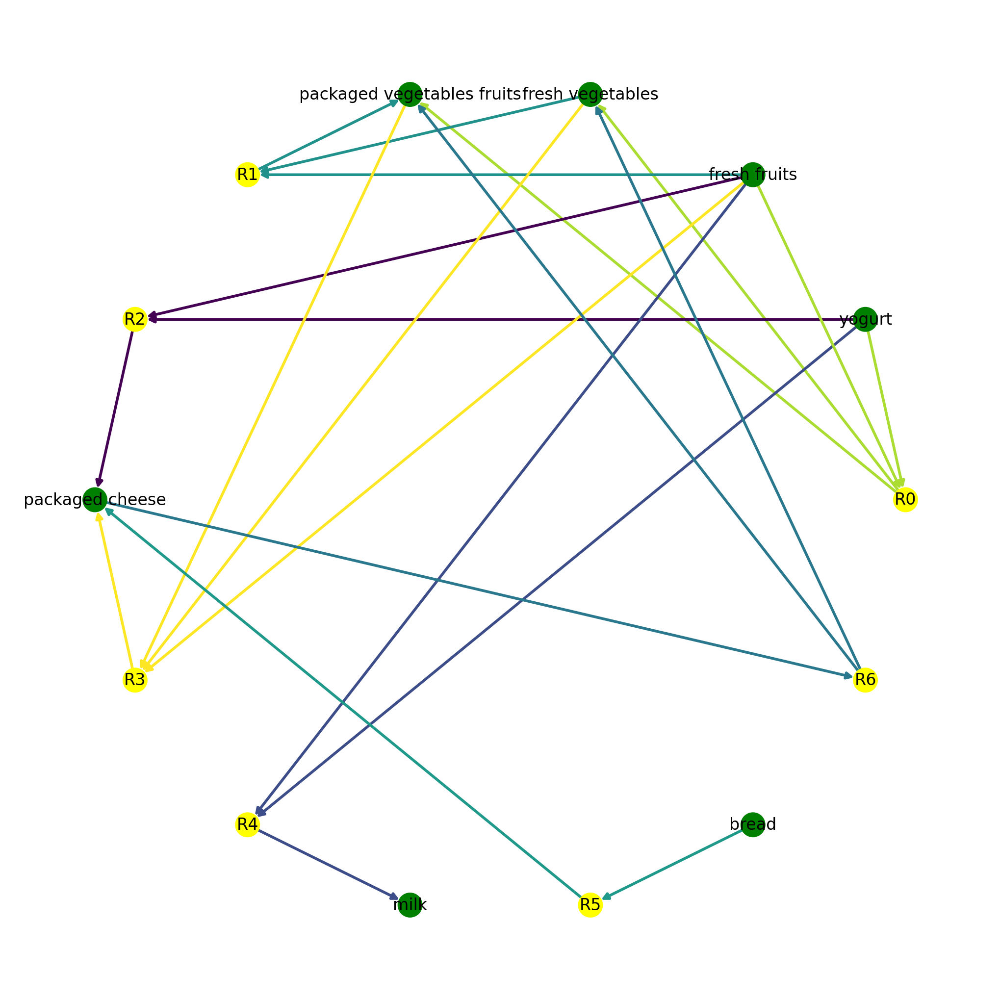

In [94]:
draw_graph(rules_format(rules_3), len(rules_format(rules_3)))

### Thrusday

In [95]:
frequent_itemsets_4 = apriori(pivot_4, min_support=0.05, use_colnames=True)

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



In [96]:
rulesConfidence_4 = association_rules(frequent_itemsets_4, metric="confidence", min_threshold=0.30)
rulesConfidence_4['Day'] = 5

In [97]:
rulesConfidence_4.sort_values(by='confidence', ascending=False, inplace=True)

In [98]:
rulesConfidence_4['Kulc'] = (rulesConfidence_4['support'] / rulesConfidence_4['antecedent support'] + rulesConfidence_4['support'] / rulesConfidence_4['consequent support']) / 2

In [99]:
rulesConfidence_4['IR'] = abs((rulesConfidence_4['antecedent support'] - rulesConfidence_4['consequent support']) / 
                            (rulesConfidence_4['antecedent support'] + rulesConfidence_4['consequent support'] - rulesConfidence_4['support']))

In [100]:
rulesConfidence_4[(rulesConfidence_4.Kulc > 0.4) & (rulesConfidence_4.IR < 0.2)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
21,(fresh vegetables),(fresh fruits),0.397053,0.519901,0.276528,0.696450,1.339583,0.070099,1.581616,5,0.614168,0.191822
43,(packaged vegetables fruits),(fresh vegetables),0.330263,0.397053,0.202731,0.613846,1.546005,0.071599,1.561415,5,0.562217,0.127319
92,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.276528,0.330263,0.158205,0.572111,1.732287,0.066878,1.565212,5,0.525568,0.119789
22,(fresh fruits),(fresh vegetables),0.519901,0.397053,0.276528,0.531885,1.339583,0.070099,1.288033,5,0.614168,0.191822
42,(fresh vegetables),(packaged vegetables fruits),0.397053,0.330263,0.202731,0.510589,1.546005,0.071599,1.368454,5,0.562217,0.127319
97,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.330263,0.276528,0.158205,0.479025,1.732287,0.066878,1.388690,5,0.525568,0.119789


In [101]:
rules_4 = rulesConfidence_4[(rulesConfidence_4.IR < 0.2) & (rulesConfidence_4.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:10]

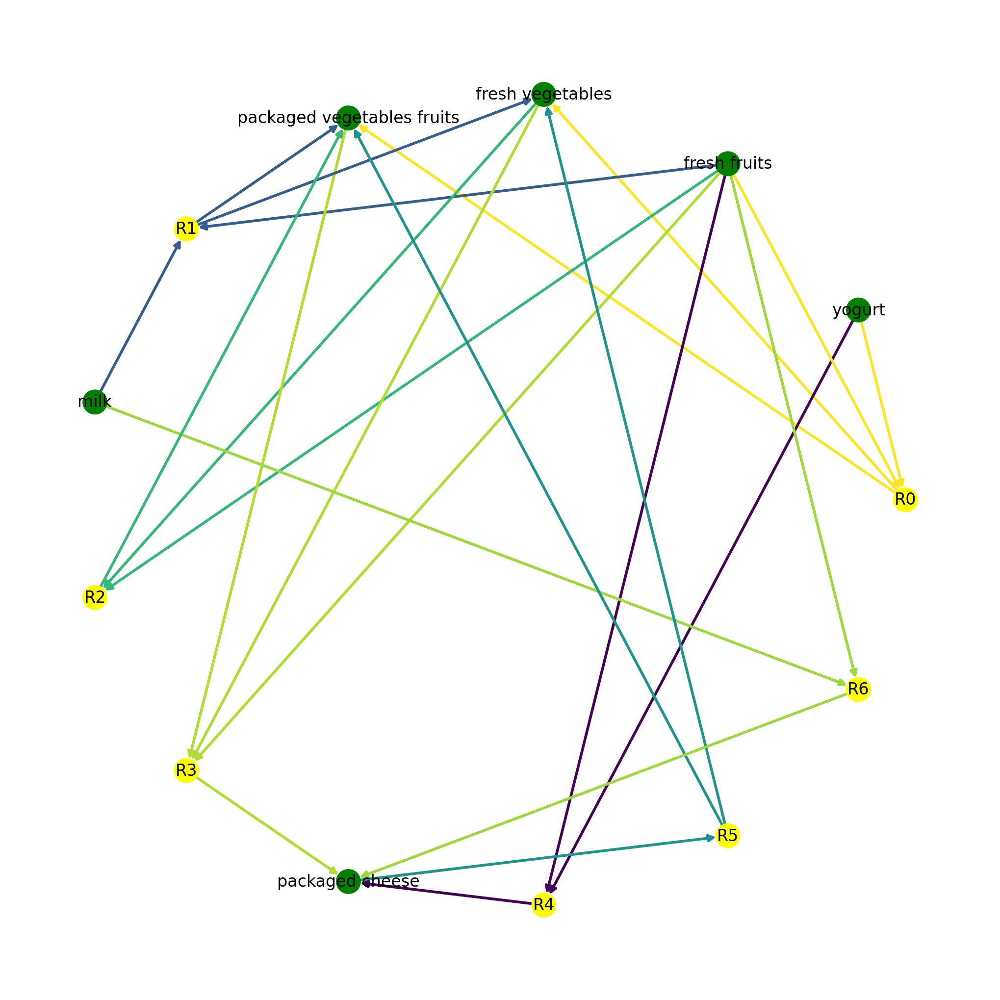

In [102]:
draw_graph(rules_format(rules_4), len(rules_format(rules_4)))

### Friday

In [103]:
frequent_itemsets_5 = apriori(pivot_5, min_support=0.05, use_colnames=True)

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



In [104]:
rulesConfidence_5 = association_rules(frequent_itemsets_5, metric="confidence", min_threshold=0.30)
rulesConfidence_5['Day'] = 6

In [105]:
rulesConfidence_5.sort_values(by='confidence', ascending=False, inplace=True)

In [106]:
rulesConfidence_5['Kulc'] = (rulesConfidence_5['support'] / rulesConfidence_5['antecedent support'] + rulesConfidence_5['support'] / rulesConfidence_5['consequent support']) / 2

In [107]:
rulesConfidence_5['IR'] = abs((rulesConfidence_5['antecedent support'] - rulesConfidence_5['consequent support']) / 
                            (rulesConfidence_5['antecedent support'] + rulesConfidence_5['consequent support'] - rulesConfidence_5['support']))

In [108]:
rules_5 = rulesConfidence_5[(rulesConfidence_5.IR < 0.2) & (rulesConfidence_5.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:10]

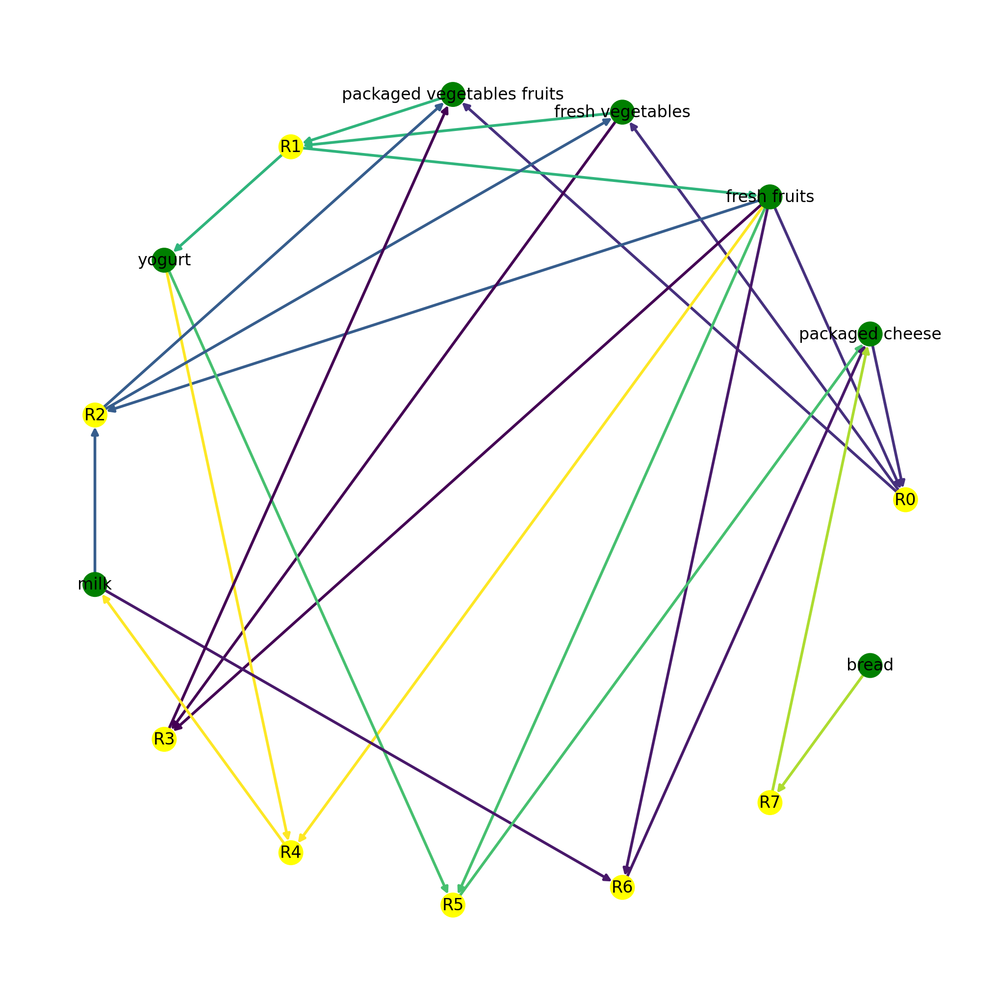

In [109]:
draw_graph(rules_format(rules_5), len(rules_format(rules_5)))

### Saturday

In [110]:
frequent_itemsets_6 = apriori(pivot_6, min_support=0.05, use_colnames=True)

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



In [111]:
rulesConfidence_6 = association_rules(frequent_itemsets_6, metric="confidence", min_threshold=0.30)
rulesConfidence_6['Day'] = 7

In [112]:
rulesConfidence_6.sort_values(by='confidence', ascending=False, inplace=True)

In [113]:
rulesConfidence_6['Kulc'] = (rulesConfidence_6['support'] / rulesConfidence_6['antecedent support'] + rulesConfidence_6['support'] / rulesConfidence_6['consequent support']) / 2

In [114]:
rulesConfidence_6['IR'] = abs((rulesConfidence_6['antecedent support'] - rulesConfidence_6['consequent support']) / 
                            (rulesConfidence_6['antecedent support'] + rulesConfidence_6['consequent support'] - rulesConfidence_6['support']))

In [115]:
rules_6 = rulesConfidence_6[(rulesConfidence_6.IR < 0.2) & (rulesConfidence_6.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:10]

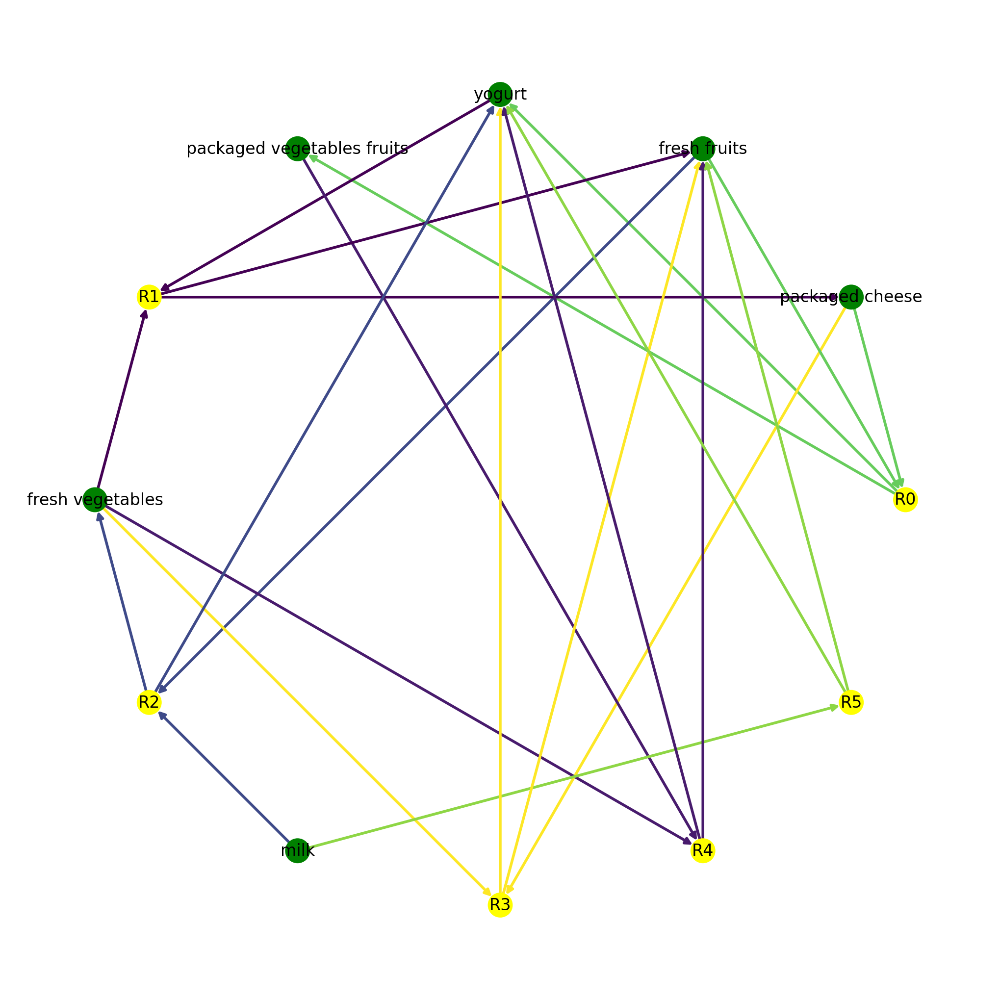

In [116]:
draw_graph(rules_format(rules_6), len(rules_format(rules_6)))

## Hidden relationships 

An infrequent (or rare) pattern is a pattern with a frequency support that is below (or far below) user-specified minimum support threshold

https://www.sciencedirect.com/topics/computer-science/negative-pattern

In [117]:
hidden_dow = rules[(rules.support < 0.03) & (rules.IR < 0.2) & (rules.Kulc > 0.03)]

In [118]:
len(hidden_dow)

0

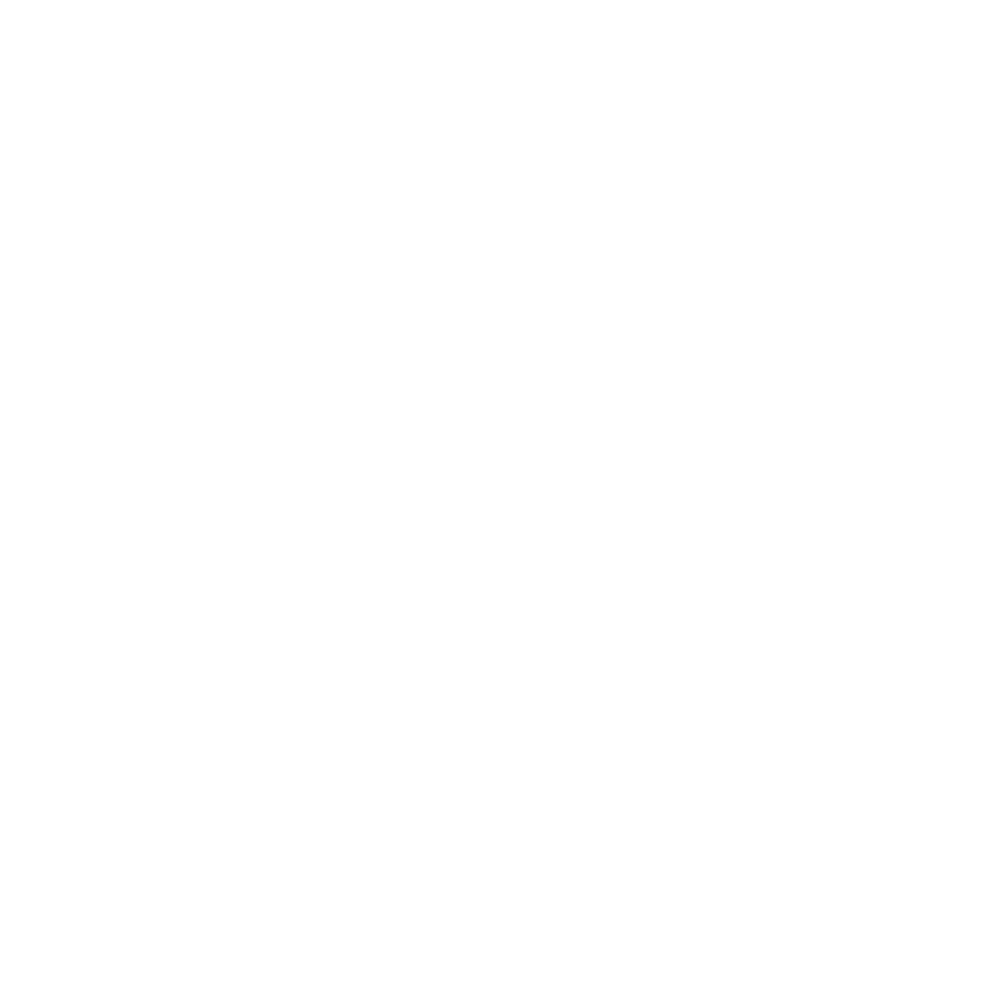

In [119]:
draw_graph(rules_format(hidden_dow), len(rules_format(hidden_dow)))

## Rules Exploration

### Substitute products

In [120]:
rulesConfidence_0[(rulesConfidence_0.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR


In [121]:
rulesConfidence_1[(rulesConfidence_1.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
58,(water seltzer sparkling water),(fresh vegetables),0.1948,0.437929,0.080965,0.415633,0.949087,-0.004343,0.961845,2,0.300258,0.44064


In [122]:
rulesConfidence_2[(rulesConfidence_2.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
49,(water seltzer sparkling water),(fresh vegetables),0.192616,0.414892,0.076805,0.398744,0.961079,-0.00311,0.973143,3,0.291932,0.418831


In [123]:
rulesConfidence_3[(rulesConfidence_3.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
46,(water seltzer sparkling water),(fresh vegetables),0.191624,0.399338,0.072341,0.377516,0.945355,-0.004182,0.964944,4,0.279334,0.400511


In [124]:
rulesConfidence_4[(rulesConfidence_4.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
46,(water seltzer sparkling water),(fresh vegetables),0.191599,0.397053,0.073276,0.382445,0.963209,-0.002799,0.976346,5,0.283498,0.398648


In [125]:
rulesConfidence_5[(rulesConfidence_5.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
53,(water seltzer sparkling water),(fresh vegetables),0.198554,0.404978,0.078171,0.393704,0.972161,-0.002239,0.981405,6,0.293365,0.392919


In [126]:
rulesConfidence_6[(rulesConfidence_6.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
75,(water seltzer sparkling water),(fresh vegetables),0.191064,0.492796,0.093961,0.491777,0.997933,-0.000195,0.997995,7,0.341223,0.511498
63,(ice cream ice),(fresh vegetables),0.136458,0.492796,0.066600,0.488065,0.990400,-0.000646,0.990759,7,0.311606,0.633317


In [127]:
concat_list = [rulesConfidence_0,rulesConfidence_1,rulesConfidence_2,rulesConfidence_3,
          rulesConfidence_4,rulesConfidence_5,rulesConfidence_6]
rules = pd.concat(concat_list)

In [128]:
rules.reset_index(drop = True, inplace = True)

In [129]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
0,"(packaged vegetables fruits, fresh herbs, fres...",(fresh vegetables),0.057215,0.533981,0.053025,0.926756,1.735559,0.022473,6.362580,1,0.513028,0.885899
1,"(fresh herbs, packaged vegetables fruits)",(fresh vegetables),0.067592,0.533981,0.061834,0.914804,1.713176,0.025741,5.469951,1,0.515301,0.864100
2,"(fresh herbs, fresh fruits)",(fresh vegetables),0.089059,0.533981,0.080592,0.904930,1.694684,0.033036,4.901825,1,0.527928,0.820212
3,"(fresh vegetables, yogurt, milk)",(fresh fruits),0.073436,0.611266,0.065369,0.890140,1.456222,0.020479,3.538438,1,0.498540,0.868400
4,"(yogurt, milk, packaged vegetables fruits)",(fresh fruits),0.065169,0.611266,0.057871,0.888014,1.452745,0.018035,3.471270,1,0.491344,0.882846
...,...,...,...,...,...,...,...,...,...,...,...,...
1650,(water seltzer sparkling water),(yogurt),0.191064,0.279162,0.058476,0.306057,1.096344,0.005139,1.038757,7,0.257764,0.213960
1651,"(fresh fruits, packaged vegetables fruits)","(fresh vegetables, yogurt)",0.285791,0.167420,0.086450,0.302494,1.806794,0.038603,1.193652,7,0.409430,0.322746
1652,"(fresh vegetables, packaged vegetables fruits)","(packaged cheese, fresh fruits)",0.260270,0.168953,0.078671,0.302267,1.789061,0.034698,1.191068,7,0.383953,0.260494
1653,"(packaged cheese, fresh fruits)","(yogurt, packaged vegetables fruits)",0.168953,0.139293,0.051004,0.301883,2.167242,0.027470,1.232897,7,0.334022,0.115299


In [130]:
substitute_products = rules[(rules.lift < 1)][['antecedents','consequents']].drop_duplicates()

In [131]:
len(substitute_products)

2

In [132]:
substitute_products.index

Int64Index([599, 1539], dtype='int64')

In [133]:
substitute = rules.loc[substitute_products.index]

In [134]:
substitute

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Day,Kulc,IR
599,(water seltzer sparkling water),(fresh vegetables),0.194800,0.437929,0.080965,0.415633,0.949087,-0.004343,0.961845,2,0.300258,0.440640
1539,(ice cream ice),(fresh vegetables),0.136458,0.492796,0.066600,0.488065,0.990400,-0.000646,0.990759,7,0.311606,0.633317


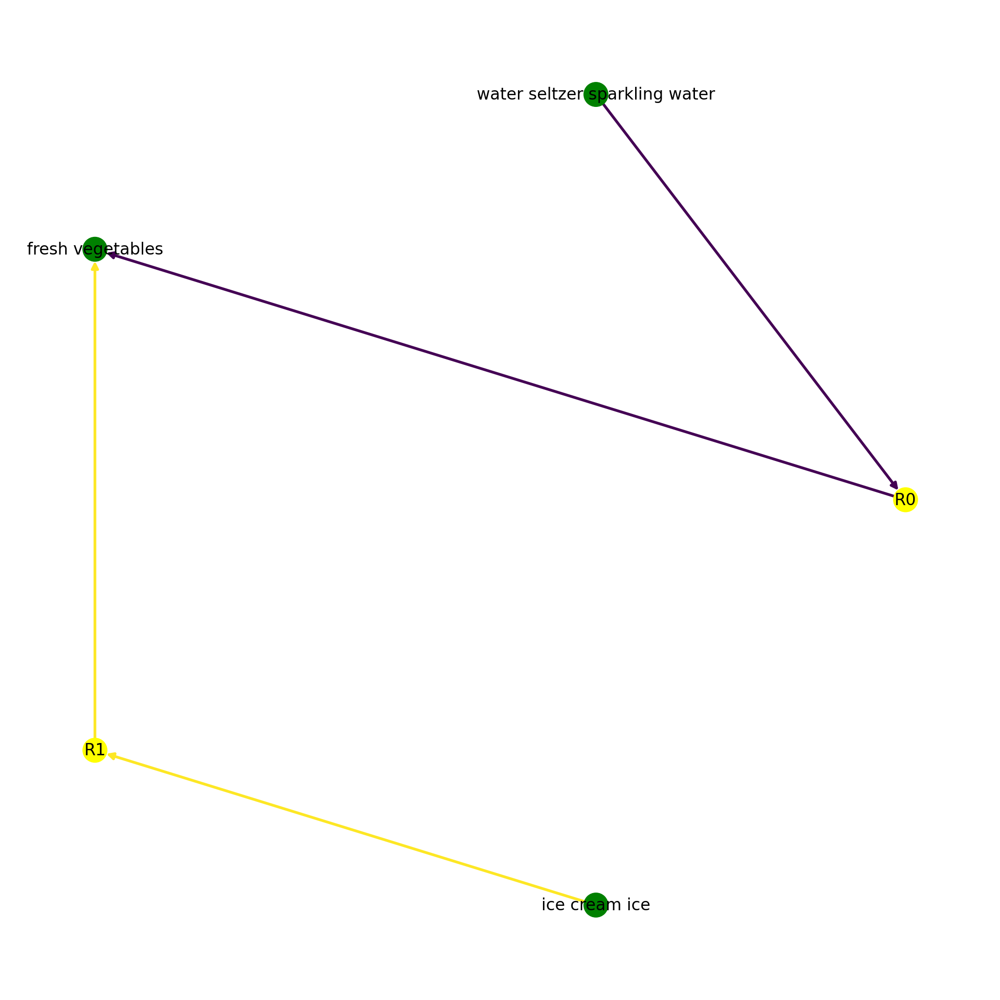

In [135]:
draw_graph(rules_format(substitute), len(rules_format(substitute)))

### Complementary Products

In [136]:
complementary_products = rules[(rules.lift > 1.8) & (rules.confidence > 0.9)]

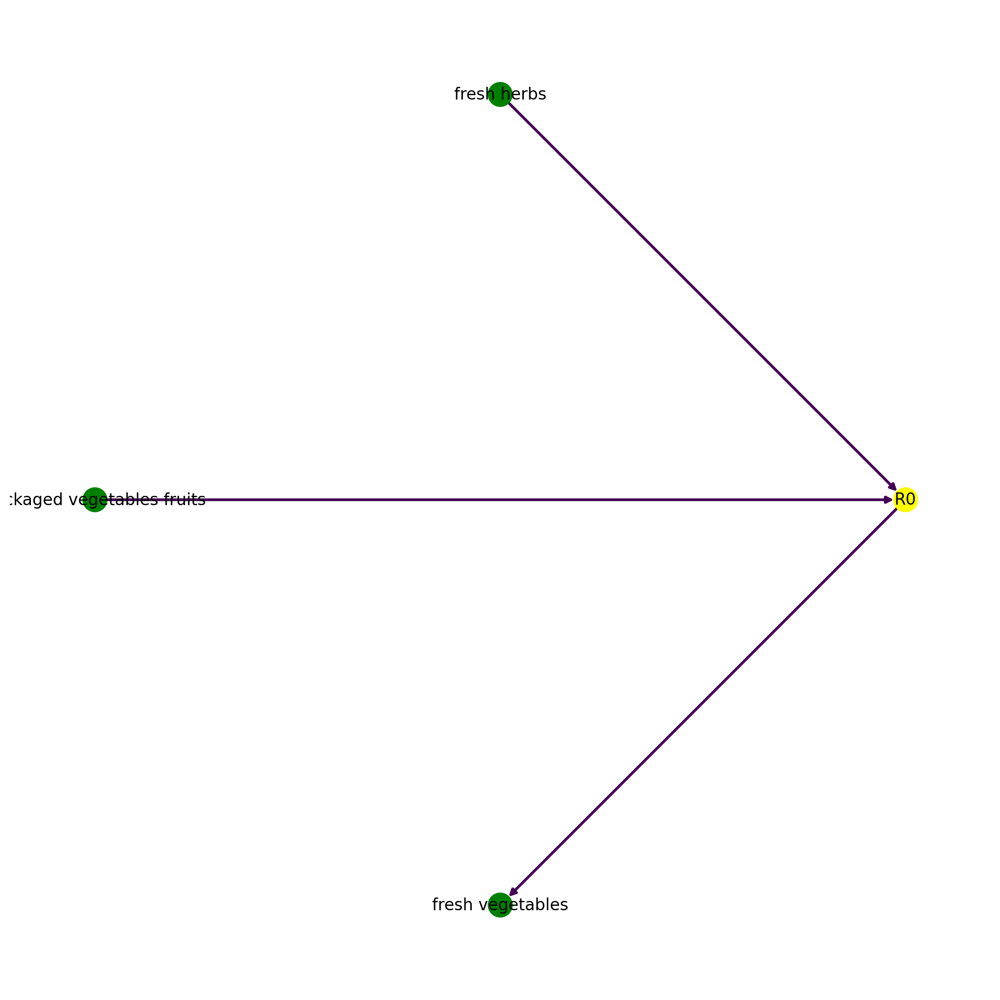

In [137]:
draw_graph(rules_format(complementary_products), len(rules_format(complementary_products)))

## All Rules -> Product/DoW

In [138]:
concat_list = [rulesConfidence_0,rulesConfidence_1,rulesConfidence_2,rulesConfidence_3,
          rulesConfidence_4,rulesConfidence_5,rulesConfidence_6]
rules = pd.concat(concat_list)

In [139]:
all_rules = pd.concat([rulesConfidence,rules])
all_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day
67,"(fresh herbs, fresh fruits)",(fresh vegetables),0.070135,0.444360,0.061815,0.881372,1.983463,0.030650,4.683872,0.510241,0.826688,NaN
146,"(fresh vegetables, yogurt, packaged vegetables...",(fresh fruits),0.087995,0.555995,0.076240,0.866413,1.558311,0.027315,3.323711,0.501768,0.824306,NaN
132,"(fresh vegetables, milk, packaged vegetables f...",(fresh fruits),0.073075,0.555995,0.062535,0.855765,1.539159,0.021906,3.078336,0.484119,0.852410,NaN
27,(fresh herbs),(fresh vegetables),0.093005,0.444360,0.078655,0.845707,1.903203,0.037327,3.601205,0.511357,0.765963,NaN
139,"(packaged cheese, fresh vegetables, packaged v...",(fresh fruits),0.081970,0.555995,0.068325,0.833537,1.499180,0.022750,2.667284,0.478212,0.832148,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
99,(water seltzer sparkling water),(yogurt),0.191064,0.279162,0.058476,0.306057,1.096344,0.005139,1.038757,0.257764,0.213960,7.0
303,"(fresh fruits, packaged vegetables fruits)","(fresh vegetables, yogurt)",0.285791,0.167420,0.086450,0.302494,1.806794,0.038603,1.193652,0.409430,0.322746,7.0
278,"(fresh vegetables, packaged vegetables fruits)","(packaged cheese, fresh fruits)",0.260270,0.168953,0.078671,0.302267,1.789061,0.034698,1.191068,0.383953,0.260494,7.0
310,"(packaged cheese, fresh fruits)","(yogurt, packaged vegetables fruits)",0.168953,0.139293,0.051004,0.301883,2.167242,0.027470,1.232897,0.334022,0.115299,7.0


In [140]:
all_rules = all_rules.drop_duplicates(subset=['antecedents','consequents'],keep='first')

## Clusters

In [141]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, RobustScaler

In [142]:
invoice_df = df[['order_id','product_name','department','days_since_prior_order']]
invoice_df

,order_id,product_name,department,days_since_prior_order
0,2425083,baking ingredients,pantry,45.0
1,2425083,soy lactosefree,dairy eggs,45.0
2,2425083,butter,dairy eggs,45.0
3,2425083,fresh vegetables,produce,45.0
4,2425083,fresh vegetables,produce,45.0
...,...,...,...,...
2019496,3390742,fresh vegetables,produce,5.0
2019497,458285,water seltzer sparkling water,beverages,3.0
2019498,458285,packaged produce,produce,3.0
2019499,458285,packaged produce,produce,3.0


In [143]:
len(df[(df.days_since_prior_order == 45)])

124342

In [144]:
invoice_df.drop(invoice_df[(invoice_df.days_since_prior_order == 45)].index, axis = 0, inplace = True)

In [145]:
invoice_df

,order_id,product_name,department,days_since_prior_order
22,1201011,tea,beverages,3.0
23,1201011,fresh vegetables,produce,3.0
24,1201011,fresh vegetables,produce,3.0
25,1201011,fresh fruits,produce,3.0
26,1201011,yogurt,dairy eggs,3.0
...,...,...,...,...
2019496,3390742,fresh vegetables,produce,5.0
2019497,458285,water seltzer sparkling water,beverages,3.0
2019498,458285,packaged produce,produce,3.0
2019499,458285,packaged produce,produce,3.0


In [146]:
order_type = invoice_df[['order_id','days_since_prior_order']].sort_values(by='order_id').drop_duplicates()
order_type.set_index('order_id',inplace=True)

In [147]:
order_type['n_items'] = pivot.sum(axis=1)

In [148]:
order_type = order_type[order_type['days_since_prior_order']>=0]

In [149]:
order_type_std = order_type.copy()

In [150]:
scaler = RobustScaler()
scaled_feat = scaler.fit_transform(order_type_std)
scaled_feat

array([[ 0.09090909,  0.16666667],
       [ 1.45454545, -0.16666667],
       [-0.09090909,  0.66666667],
       ...,
       [-0.45454545,  0.66666667],
       [-0.09090909, -0.33333333],
       [-0.45454545,  0.16666667]])

In [151]:
order_type_std[['days_since_prior_order','n_items']] = scaled_feat

In [152]:
order_type_std

,days_since_prior_order,n_items
order_id,,
10,0.090909,0.166667
11,1.454545,-0.166667
28,-0.090909,0.666667
38,1.545455,0.000000
56,-0.454545,0.666667
...,...,...
3420991,0.000000,0.333333
3421019,-0.363636,-0.500000
3421027,-0.454545,0.666667


In [153]:
mclust3 = KMeans(n_clusters=3, init='k-means++', n_init=10, random_state=1)

In [154]:
km_labels_3 = mclust3.fit_predict(pd.DataFrame(order_type_std))

In [155]:
pd.DataFrame(km_labels_3).value_counts()

2    105925
0     43018
1     38803
dtype: int64

In [156]:
order_type['cluster3'] = km_labels_3

In [157]:
order_type[['days_since_prior_order','n_items','cluster3']].groupby('cluster3').mean()

,days_since_prior_order,n_items
cluster3,,
0,8.962667,13.719350
1,26.421540,6.598124
2,6.178079,4.883493


## Cluster 0

In [158]:
order_type.reset_index()

,order_id,days_since_prior_order,n_items,cluster3
0,10,8.0,7.0,2
1,11,23.0,5.0,1
2,28,6.0,10.0,0
3,38,24.0,6.0,1
4,56,2.0,10.0,0
...,...,...,...,...
187741,3420991,7.0,8.0,2
187742,3421019,3.0,3.0,2
187743,3421027,2.0,10.0,0
187744,3421074,6.0,4.0,2


In [159]:
order_type[(order_type.cluster3 == 0)]

,days_since_prior_order,n_items,cluster3
order_id,,,
28,6.0,10.0,0
56,2.0,10.0,0
192,8.0,11.0,0
405,16.0,10.0,0
423,7.0,13.0,0
...,...,...,...
3420584,7.0,10.0,0
3420771,6.0,12.0,0
3420861,5.0,11.0,0


In [160]:
cluster_0 = df[(df.order_id.isin(order_type[(order_type.cluster3 == 0)].index) == True)].sort_values(by = 'order_id', ascending = True)

In [161]:
cluster_0

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,department_id,product_name,department
1166581,28,98256,29,3,13,6.0,83,8,1,4,fresh vegetables,produce
1166589,28,98256,29,3,13,6.0,24,16,1,4,fresh fruits,produce
1166588,28,98256,29,3,13,6.0,83,15,1,4,fresh vegetables,produce
1166574,28,98256,29,3,13,6.0,36,1,0,16,butter,dairy eggs
1166575,28,98256,29,3,13,6.0,108,2,1,16,other creams cheeses,dairy eggs
...,...,...,...,...,...,...,...,...,...,...,...,...
419568,3421027,51127,64,2,20,2.0,83,9,1,4,fresh vegetables,produce
419569,3421027,51127,64,2,20,2.0,36,10,0,16,butter,dairy eggs
419570,3421027,51127,64,2,20,2.0,120,11,0,16,yogurt,dairy eggs
419563,3421027,51127,64,2,20,2.0,24,4,1,4,fresh fruits,produce


In [162]:
cluster_0 = cluster_0[['order_id','product_name']]

In [163]:
cluster_0

,order_id,product_name
1166581,28,fresh vegetables
1166589,28,fresh fruits
1166588,28,fresh vegetables
1166574,28,butter
1166575,28,other creams cheeses
...,...,...
419568,3421027,fresh vegetables
419569,3421027,butter
419570,3421027,yogurt
419563,3421027,fresh fruits


In [164]:
pivot_cluster_0 = pd.pivot_table(cluster_0, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

In [165]:
frequent_itemsets_cluster_0 = apriori(pivot_cluster_0, min_support=0.075, use_colnames=True)
frequent_itemsets_cluster_0

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.088079,(asian foods)
1,0.104026,(baby food formula)
2,0.146869,(baking ingredients)
3,0.334883,(bread)
4,0.147427,(breakfast bakery)
...,...,...
547,0.099214,"(fresh vegetables, fresh fruits, packaged vege..."
548,0.083151,"(fresh vegetables, fresh fruits, milk, yogurt,..."
549,0.109350,"(fresh vegetables, fresh fruits, packaged vege..."
550,0.119183,"(fresh vegetables, fresh fruits, packaged vege..."


In [166]:
rulesConfidence_cluster_0 = association_rules(frequent_itemsets_cluster_0, metric="confidence", min_threshold=0.30)
rulesConfidence_cluster_0.sort_values(by='confidence', ascending=False, inplace=True)

In [167]:
print('There are ',len(rulesConfidence_cluster_0), 'association rules!')

There are  1595 association rules!


In [168]:
rulesConfidence_cluster_0['Kulc'] = (rulesConfidence_cluster_0['support'] / rulesConfidence_cluster_0['antecedent support'] + rulesConfidence_cluster_0['support'] / rulesConfidence_cluster_0['consequent support']) / 2

In [169]:
rulesConfidence_cluster_0['IR'] = abs((rulesConfidence_cluster_0['antecedent support'] - rulesConfidence_cluster_0['consequent support']) / 
                            (rulesConfidence_cluster_0['antecedent support'] + rulesConfidence_cluster_0['consequent support'] - rulesConfidence_cluster_0['support']))

In [170]:
rulesConfidence_cluster_0['Day'] = -1

In [171]:
rulesConfidence_cluster_0['cluster'] = 0

In [172]:
rulesConfidence_cluster_0

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
1167,"(packaged vegetables fruits, fresh herbs, fres...",(fresh vegetables),0.113301,0.705030,0.106490,0.939885,1.333113,0.026609,4.906763,0.545464,0.831265,-1,0
782,"(fresh herbs, packaged vegetables fruits)",(fresh vegetables),0.125947,0.705030,0.117462,0.932632,1.322825,0.028666,4.378479,0.549619,0.811592,-1,0
568,"(fresh herbs, fresh fruits)",(fresh vegetables),0.155540,0.705030,0.144195,0.927066,1.314931,0.034535,4.044347,0.565795,0.767044,-1,0
1541,"(fresh vegetables, yogurt, milk, packaged vege...",(fresh fruits),0.118160,0.805058,0.109350,0.925438,1.149529,0.014224,2.614481,0.530633,0.843992,-1,0
1492,"(fresh vegetables, yogurt, packaged vegetables...",(fresh fruits),0.086685,0.805058,0.079827,0.920890,1.143880,0.010041,2.464195,0.510024,0.884788,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,"(packaged cheese, fresh fruits, packaged veget...",(soy lactosefree),0.261030,0.294435,0.078804,0.301897,1.025343,0.001948,1.010689,0.284771,0.070080,-1,0
524,"(milk, packaged vegetables fruits)",(eggs),0.263518,0.261309,0.079502,0.301694,1.154547,0.010642,1.057832,0.302969,0.004959,-1,0
1129,(eggs),"(fresh vegetables, milk, fresh fruits)",0.261309,0.255753,0.078595,0.300774,1.176031,0.011764,1.064386,0.304041,0.012671,-1,0
246,(yogurt),(soy lactosefree),0.482310,0.294435,0.145009,0.300655,1.021127,0.003000,1.008895,0.396578,0.297395,-1,0


In [173]:
rulesConfidence_cluster_0[(rulesConfidence_cluster_0.IR < 0.2) & (rulesConfidence_cluster_0.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:20]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
1587,"(packaged cheese, yogurt, fresh fruits)","(milk, packaged vegetables fruits)",0.210400,0.263518,0.078339,0.372335,1.412940,0.022895,1.173368,0.334809,0.134277,-1,0
1583,"(milk, fresh fruits, packaged vegetables fruits)","(packaged cheese, yogurt)",0.232647,0.243782,0.078339,0.336731,1.381279,0.021624,1.140138,0.329040,0.027971,-1,0
1594,"(packaged cheese, yogurt)","(milk, fresh fruits, packaged vegetables fruits)",0.243782,0.232647,0.078339,0.321350,1.381279,0.021624,1.130706,0.329040,0.027971,-1,0
1543,"(fresh vegetables, milk, fresh fruits)","(yogurt, packaged vegetables fruits)",0.255753,0.313683,0.109350,0.427559,1.363029,0.029124,1.198930,0.388079,0.125909,-1,0
1556,"(yogurt, packaged vegetables fruits)","(fresh vegetables, milk, fresh fruits)",0.313683,0.255753,0.109350,0.348599,1.363029,0.029124,1.142533,0.388079,0.125909,-1,0
1555,"(milk, packaged vegetables fruits)","(fresh vegetables, yogurt, fresh fruits)",0.263518,0.304593,0.109350,0.414961,1.362345,0.029084,1.188650,0.386981,0.089536,-1,0
1544,"(fresh vegetables, yogurt, fresh fruits)","(milk, packaged vegetables fruits)",0.304593,0.263518,0.109350,0.359002,1.362345,0.029084,1.148962,0.386981,0.089536,-1,0
1533,"(packaged cheese, yogurt, fresh fruits)","(fresh vegetables, milk)",0.210400,0.290623,0.083151,0.395205,1.359857,0.022004,1.172922,0.340660,0.191978,-1,0
1552,"(fresh vegetables, milk)","(yogurt, fresh fruits, packaged vegetables fru...",0.290623,0.279325,0.109350,0.376260,1.347033,0.028171,1.155409,0.383869,0.024528,-1,0
1549,"(yogurt, fresh fruits, packaged vegetables fru...","(fresh vegetables, milk)",0.279325,0.290623,0.109350,0.391478,1.347033,0.028171,1.165738,0.383869,0.024528,-1,0


## Substitutes

In [174]:
rulesConfidence_cluster_0[(rulesConfidence_cluster_0.IR < 0.2) & (rulesConfidence_cluster_0.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
62,(chips pretzels),(milk),0.337928,0.416384,0.138547,0.409988,0.984640,-0.002161,0.989160,0.371363,0.127411,-1,0
415,(chips pretzels),"(yogurt, fresh fruits)",0.337928,0.410410,0.136966,0.405311,0.987576,-0.001723,0.991426,0.369520,0.118555,-1,0
1058,(chips pretzels),"(fresh vegetables, fresh fruits, packaged vege...",0.337928,0.424892,0.130713,0.386806,0.910363,-0.012870,0.937889,0.347222,0.137577,-1,0
734,(soy lactosefree),"(packaged cheese, fresh fruits)",0.294435,0.382979,0.110535,0.375414,0.980248,-0.002227,0.987888,0.332017,0.156196,-1,0
737,(water seltzer sparkling water),"(packaged cheese, fresh fruits)",0.282975,0.382979,0.105119,0.371478,0.969969,-0.003255,0.981701,0.322977,0.178314,-1,0
1066,"(packaged cheese, fresh fruits, packaged veget...",(chips pretzels),0.261030,0.337928,0.088172,0.337786,0.999579,-0.000037,0.999785,0.299353,0.150548,-1,0
406,"(fresh fruits, soy lactosefree)",(chips pretzels),0.250523,0.337928,0.084523,0.337385,0.998393,-0.000136,0.999180,0.293753,0.173448,-1,0
397,(chips pretzels),"(milk, fresh fruits)",0.337928,0.347389,0.113929,0.337140,0.970495,-0.003464,0.984537,0.332549,0.016558,-1,0
68,(soy lactosefree),(chips pretzels),0.294435,0.337928,0.099145,0.336728,0.996449,-0.000353,0.998191,0.315059,0.081568,-1,0
21,(soy lactosefree),(bread),0.294435,0.334883,0.098447,0.334360,0.998437,-0.000154,0.999214,0.314167,0.076192,-1,0


## Can be complementary

In [175]:
rulesConfidence_cluster_0[(rulesConfidence_cluster_0.lift > 1.4) & (rulesConfidence_cluster_0.IR < 0.2)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
1587,"(packaged cheese, yogurt, fresh fruits)","(milk, packaged vegetables fruits)",0.2104,0.263518,0.078339,0.372335,1.41294,0.022895,1.173368,0.334809,0.134277,-1,0


## Cluster 1

In [176]:
cluster_1 = df[(df.order_id.isin(order_type[(order_type.cluster3 == 1)].index) == True)].sort_values(by = 'order_id', ascending = True)

In [177]:
cluster_1 = cluster_1[['order_id','product_name']]

In [178]:
pivot_cluster_1 = pd.pivot_table(cluster_1, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

In [179]:
frequent_itemsets_cluster_1 = apriori(pivot_cluster_1, min_support=0.075, use_colnames=True)
frequent_itemsets_cluster_1

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.143932,(bread)
1,0.085663,(cereal)
2,0.153596,(chips pretzels)
3,0.101281,(crackers)
4,0.076437,(cream)
5,0.133031,(eggs)
6,0.092776,(fresh dips tapenades)
7,0.492127,(fresh fruits)
8,0.084169,(fresh herbs)
9,0.415097,(fresh vegetables)


In [180]:
rulesConfidence_cluster_1 = association_rules(frequent_itemsets_cluster_1, metric="confidence", min_threshold=0.30)
rulesConfidence_cluster_1.sort_values(by='confidence', ascending=False, inplace=True)

In [181]:
rulesConfidence_cluster_1

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
41,"(yogurt, packaged vegetables fruits)",(fresh fruits),0.105842,0.492127,0.083963,0.793280,1.611941,0.031875,2.456814
36,"(fresh vegetables, yogurt)",(fresh fruits),0.125635,0.492127,0.098111,0.780923,1.586833,0.036283,2.318241
31,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.208051,0.492127,0.158622,0.762418,1.549230,0.056234,2.137674
27,"(packaged cheese, fresh vegetables)",(fresh fruits),0.116563,0.492127,0.083499,0.716339,1.455598,0.026135,1.790421
10,(packaged vegetables fruits),(fresh fruits),0.331005,0.492127,0.229261,0.692619,1.407399,0.066364,1.652260
32,"(fresh fruits, packaged vegetables fruits)",(fresh vegetables),0.229261,0.415097,0.158622,0.691884,1.666802,0.063456,1.898321
6,(frozen produce),(fresh fruits),0.113909,0.492127,0.078293,0.687330,1.396653,0.022235,1.624312
4,(fresh vegetables),(fresh fruits),0.415097,0.492127,0.280210,0.675048,1.371695,0.075930,1.562918
13,(yogurt),(fresh fruits),0.232534,0.492127,0.156070,0.671174,1.363822,0.041634,1.544503
28,"(packaged cheese, fresh fruits)",(fresh vegetables),0.126485,0.415097,0.083499,0.660147,1.590344,0.030995,1.721046


In [182]:
rulesConfidence_cluster_1['Kulc'] = (rulesConfidence_cluster_1['support'] / rulesConfidence_cluster_1['antecedent support'] + rulesConfidence_cluster_1['support'] / rulesConfidence_cluster_1['consequent support']) / 2

In [183]:
rulesConfidence_cluster_1['IR'] = abs((rulesConfidence_cluster_1['antecedent support'] - rulesConfidence_cluster_1['consequent support']) / 
                            (rulesConfidence_cluster_1['antecedent support'] + rulesConfidence_cluster_1['consequent support'] - rulesConfidence_cluster_1['support']))

In [184]:
rulesConfidence_cluster_1['Day'] = -1

In [185]:
rulesConfidence_cluster_1['cluster'] = 1

In [186]:
rulesConfidence_cluster_1[(rulesConfidence_cluster_1.IR < 0.2) & (rulesConfidence_cluster_1.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:20]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
35,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.331005,0.280210,0.158622,0.479212,1.710187,0.065871,1.382117,0.522647,0.112231,-1,1
30,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.280210,0.331005,0.158622,0.566081,1.710187,0.065871,1.541751,0.522647,0.112231,-1,1
42,"(fresh fruits, packaged vegetables fruits)",(yogurt),0.229261,0.232534,0.083963,0.366232,1.574964,0.030652,1.210958,0.363655,0.008662,-1,1
43,(yogurt),"(fresh fruits, packaged vegetables fruits)",0.232534,0.229261,0.083963,0.361077,1.574964,0.030652,1.206311,0.363655,0.008662,-1,1
17,(fresh vegetables),(packaged vegetables fruits),0.415097,0.331005,0.208051,0.501211,1.514207,0.070652,1.341237,0.564877,0.156289,-1,1
18,(packaged vegetables fruits),(fresh vegetables),0.331005,0.415097,0.208051,0.628543,1.514207,0.070652,1.574617,0.564877,0.156289,-1,1
39,(yogurt),"(fresh vegetables, fresh fruits)",0.232534,0.280210,0.098111,0.421922,1.505733,0.032953,1.245142,0.386028,0.114985,-1,1
37,"(fresh vegetables, fresh fruits)",(yogurt),0.280210,0.232534,0.098111,0.350133,1.505733,0.032953,1.180960,0.386028,0.114985,-1,1
29,(packaged cheese),"(fresh vegetables, fresh fruits)",0.210293,0.280210,0.083499,0.397059,1.417003,0.024572,1.193798,0.347522,0.171785,-1,1
4,(fresh vegetables),(fresh fruits),0.415097,0.492127,0.280210,0.675048,1.371695,0.075930,1.562918,0.622217,0.122852,-1,1


In [187]:
rulesConfidence_cluster_1[(rulesConfidence_cluster_1.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
20,(water seltzer sparkling water),(fresh vegetables),0.193619,0.415097,0.076283,0.393984,0.949137,-0.004088,0.965161,0.288877,0.415973,-1,1


In [188]:
rulesConfidence_cluster_1[(rulesConfidence_cluster_1.lift > 1.5) & (rulesConfidence_cluster_1.IR < 0.2)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
18,(packaged vegetables fruits),(fresh vegetables),0.331005,0.415097,0.208051,0.628543,1.514207,0.070652,1.574617,0.564877,0.156289,-1,1
30,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.280210,0.331005,0.158622,0.566081,1.710187,0.065871,1.541751,0.522647,0.112231,-1,1
17,(fresh vegetables),(packaged vegetables fruits),0.415097,0.331005,0.208051,0.501211,1.514207,0.070652,1.341237,0.564877,0.156289,-1,1
35,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.331005,0.280210,0.158622,0.479212,1.710187,0.065871,1.382117,0.522647,0.112231,-1,1
39,(yogurt),"(fresh vegetables, fresh fruits)",0.232534,0.280210,0.098111,0.421922,1.505733,0.032953,1.245142,0.386028,0.114985,-1,1
42,"(fresh fruits, packaged vegetables fruits)",(yogurt),0.229261,0.232534,0.083963,0.366232,1.574964,0.030652,1.210958,0.363655,0.008662,-1,1
43,(yogurt),"(fresh fruits, packaged vegetables fruits)",0.232534,0.229261,0.083963,0.361077,1.574964,0.030652,1.206311,0.363655,0.008662,-1,1
37,"(fresh vegetables, fresh fruits)",(yogurt),0.280210,0.232534,0.098111,0.350133,1.505733,0.032953,1.180960,0.386028,0.114985,-1,1


## Cluster 2

In [189]:
cluster_2 = df[(df.order_id.isin(order_type[(order_type.cluster3 == 2)].index) == True)].sort_values(by = 'order_id', ascending = True)

In [190]:
cluster_2 = cluster_2[['order_id','product_name']]

In [191]:
pivot_cluster_2 = pd.pivot_table(cluster_2, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

In [192]:
frequent_itemsets_cluster_2 = apriori(pivot_cluster_2, min_support=0.075, use_colnames=True)
frequent_itemsets_cluster_2

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.101421,(bread)
1,0.106396,(chips pretzels)
2,0.087260,(eggs)
3,0.481067,(fresh fruits)
4,0.348690,(fresh vegetables)
5,0.076677,(frozen produce)
6,0.078461,(ice cream ice)
7,0.190012,(milk)
8,0.140722,(packaged cheese)
9,0.273996,(packaged vegetables fruits)


In [193]:
rulesConfidence_cluster_2 = association_rules(frequent_itemsets_cluster_2, metric="confidence", min_threshold=0.30)
rulesConfidence_cluster_2.sort_values(by='confidence', ascending=False, inplace=True)

In [194]:
rulesConfidence_cluster_2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
9,"(fresh vegetables, packaged vegetables fruits)",(fresh fruits),0.143375,0.481067,0.100118,0.698295,1.451554,0.031145,1.720000
4,(packaged vegetables fruits),(fresh fruits),0.273996,0.481067,0.178239,0.650519,1.352242,0.046429,1.484866
0,(fresh vegetables),(fresh fruits),0.348690,0.481067,0.216474,0.620820,1.290508,0.048731,1.368568
5,(yogurt),(fresh fruits),0.186443,0.481067,0.110767,0.594106,1.234976,0.021075,1.278495
10,"(fresh fruits, packaged vegetables fruits)",(fresh vegetables),0.178239,0.348690,0.100118,0.561706,1.610902,0.037968,1.486010
2,(milk),(fresh fruits),0.190012,0.481067,0.106424,0.560093,1.164274,0.015016,1.179644
7,(packaged vegetables fruits),(fresh vegetables),0.273996,0.348690,0.143375,0.523275,1.500687,0.047835,1.366216
8,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.216474,0.273996,0.100118,0.462495,1.687962,0.040805,1.350692
1,(fresh fruits),(fresh vegetables),0.481067,0.348690,0.216474,0.449987,1.290508,0.048731,1.184172
6,(fresh vegetables),(packaged vegetables fruits),0.348690,0.273996,0.143375,0.411182,1.500687,0.047835,1.232985


In [195]:
rulesConfidence_cluster_2['Kulc'] = (rulesConfidence_cluster_2['support'] / rulesConfidence_cluster_2['antecedent support'] + rulesConfidence_cluster_2['support'] / rulesConfidence_cluster_2['consequent support']) / 2

In [196]:
rulesConfidence_cluster_2['IR'] = abs((rulesConfidence_cluster_2['antecedent support'] - rulesConfidence_cluster_2['consequent support']) / 
                            (rulesConfidence_cluster_2['antecedent support'] + rulesConfidence_cluster_2['consequent support'] - rulesConfidence_cluster_2['support']))

In [197]:
rulesConfidence_cluster_2['Day'] = -1

In [198]:
rulesConfidence_cluster_2['cluster'] = 2

In [199]:
rulesConfidence_cluster_2[(rulesConfidence_cluster_2.IR < 0.2) & (rulesConfidence_cluster_2.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:20]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
8,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.216474,0.273996,0.100118,0.462495,1.687962,0.040805,1.350692,0.413947,0.147359,-1,2
11,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.273996,0.216474,0.100118,0.365400,1.687962,0.040805,1.234677,0.413947,0.147359,-1,2
7,(packaged vegetables fruits),(fresh vegetables),0.273996,0.348690,0.143375,0.523275,1.500687,0.047835,1.366216,0.467228,0.155837,-1,2
6,(fresh vegetables),(packaged vegetables fruits),0.348690,0.273996,0.143375,0.411182,1.500687,0.047835,1.232985,0.467228,0.155837,-1,2


In [200]:
rulesConfidence_cluster_2[(rulesConfidence_cluster_2.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster


In [201]:
rulesConfidence_cluster_2[(rulesConfidence_cluster_2.lift > 1.5) & (rulesConfidence_cluster_2.IR < 0.2)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
7,(packaged vegetables fruits),(fresh vegetables),0.273996,0.348690,0.143375,0.523275,1.500687,0.047835,1.366216,0.467228,0.155837,-1,2
8,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.216474,0.273996,0.100118,0.462495,1.687962,0.040805,1.350692,0.413947,0.147359,-1,2
6,(fresh vegetables),(packaged vegetables fruits),0.348690,0.273996,0.143375,0.411182,1.500687,0.047835,1.232985,0.467228,0.155837,-1,2
11,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.273996,0.216474,0.100118,0.365400,1.687962,0.040805,1.234677,0.413947,0.147359,-1,2


## Just a bought one time or didnt come again

In [202]:
cluster_first_timer = df[(df.days_since_prior_order == 45)]

In [203]:
cluster_first_timer

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,department_id,product_name,department
0,2425083,49125,1,2,18,45.0,17,1,0,13,baking ingredients,pantry
1,2425083,49125,1,2,18,45.0,91,2,0,16,soy lactosefree,dairy eggs
2,2425083,49125,1,2,18,45.0,36,3,0,16,butter,dairy eggs
3,2425083,49125,1,2,18,45.0,83,4,0,4,fresh vegetables,produce
4,2425083,49125,1,2,18,45.0,83,5,0,4,fresh vegetables,produce
...,...,...,...,...,...,...,...,...,...,...,...,...
2019349,3231704,187116,1,6,9,45.0,31,2,0,7,refrigerated,beverages
2019350,3231704,187116,1,6,9,45.0,24,3,0,4,fresh fruits,produce
2019351,3231704,187116,1,6,9,45.0,83,4,0,4,fresh vegetables,produce
2019352,3231704,187116,1,6,9,45.0,24,5,0,4,fresh fruits,produce


In [204]:
len(cluster_first_timer.order_id.unique())

12254

In [205]:
len(cluster_first_timer)

124342

In [206]:
print('itens per order:', len(cluster_first_timer)/len(cluster_first_timer.order_id.unique()))

itens per order: 10.147054023176105


In [207]:
cluster_first_timer = cluster_first_timer[['order_id','product_name']]

In [208]:
pivot_cluster_first_timer = pd.pivot_table(cluster_first_timer, 
                       index='order_id',
                       columns='product_name',
                       aggfunc=lambda x: 1 if len(x)>0 else 0).fillna(0)

In [209]:
pivot_cluster_first_timer.sum(axis = 1).mean()

7.314019911865513

In [210]:
frequent_itemsets_cluster_first_timer = apriori(pivot_cluster_first_timer, min_support=0.075, use_colnames=True)
frequent_itemsets_cluster_first_timer

C:\Users\joaoa\anaconda3\envs\digbig\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.166395,(bread)
1,0.102416,(cereal)
2,0.173005,(chips pretzels)
3,0.116778,(crackers)
4,0.080627,(cream)
...,...,...
63,0.075078,"(milk, fresh fruits, packaged vegetables fruits)"
64,0.088134,"(packaged cheese, fresh fruits, packaged veget..."
65,0.101191,"(yogurt, fresh fruits, packaged vegetables fru..."
66,0.083565,"(packaged cheese, fresh vegetables, packaged v..."


In [211]:
rulesConfidence_cluster_first_timer = association_rules(frequent_itemsets_cluster_first_timer, metric="confidence", min_threshold=0.30)
rulesConfidence_cluster_first_timer.sort_values(by='confidence', ascending=False, inplace=True)

In [212]:
rulesConfidence_cluster_first_timer['Kulc'] = (rulesConfidence_cluster_first_timer['support'] / rulesConfidence_cluster_first_timer['antecedent support'] + rulesConfidence_cluster_first_timer['support'] / rulesConfidence_cluster_first_timer['consequent support']) / 2

In [213]:
rulesConfidence_cluster_first_timer['IR'] = abs((rulesConfidence_cluster_first_timer['antecedent support'] - rulesConfidence_cluster_first_timer['consequent support']) / 
                            (rulesConfidence_cluster_first_timer['antecedent support'] + rulesConfidence_cluster_first_timer['consequent support'] - rulesConfidence_cluster_first_timer['support']))

In [214]:
rulesConfidence_cluster_first_timer['Day'] = -1

In [215]:
rulesConfidence_cluster_first_timer['cluster'] = 3

In [216]:
rulesConfidence_cluster_first_timer[(rulesConfidence_cluster_first_timer.IR < 0.2) & (rulesConfidence_cluster_first_timer.lift > 1.3)].sort_values(by = 'lift', ascending = False)[0:20]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
47,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.312551,0.360372,0.185898,0.594778,1.650455,0.073264,1.578463,0.555315,0.098190,-1,3
52,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.360372,0.312551,0.185898,0.515851,1.650455,0.073264,1.419913,0.555315,0.098190,-1,3
31,(yogurt),(milk),0.262363,0.219520,0.089195,0.339969,1.548691,0.031601,1.182489,0.373144,0.109102,-1,3
32,(milk),(yogurt),0.219520,0.262363,0.089195,0.406320,1.548691,0.031601,1.242481,0.373144,0.109102,-1,3
71,(packaged cheese),"(fresh vegetables, packaged vegetables fruits)",0.232904,0.237473,0.083565,0.358795,1.510883,0.028256,1.189208,0.355342,0.011814,-1,3
70,"(fresh vegetables, packaged vegetables fruits)",(packaged cheese),0.237473,0.232904,0.083565,0.351890,1.510883,0.028256,1.183590,0.355342,0.011814,-1,3
67,(yogurt),"(fresh fruits, packaged vegetables fruits)",0.262363,0.261384,0.101191,0.385692,1.475576,0.032614,1.202355,0.386415,0.002317,-1,3
66,"(fresh fruits, packaged vegetables fruits)",(yogurt),0.261384,0.262363,0.101191,0.387137,1.475576,0.032614,1.203592,0.386415,0.002317,-1,3
24,(fresh vegetables),(packaged vegetables fruits),0.448915,0.360372,0.237473,0.528995,1.467912,0.075697,1.358006,0.593981,0.154845,-1,3
25,(packaged vegetables fruits),(fresh vegetables),0.360372,0.448915,0.237473,0.658967,1.467912,0.075697,1.615932,0.593981,0.154845,-1,3


In [217]:
rulesConfidence_cluster_first_timer[(rulesConfidence_cluster_first_timer.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
27,(water seltzer sparkling water),(fresh vegetables),0.177983,0.448915,0.075812,0.425951,0.948847,-0.004087,0.959998,0.297415,0.491633,-1,3


In [218]:
rulesConfidence_cluster_first_timer[(rulesConfidence_cluster_first_timer.lift > 1.5) & (rulesConfidence_cluster_first_timer.IR < 0.2)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster
47,"(fresh vegetables, fresh fruits)",(packaged vegetables fruits),0.312551,0.360372,0.185898,0.594778,1.650455,0.073264,1.578463,0.555315,0.098190,-1,3
52,(packaged vegetables fruits),"(fresh vegetables, fresh fruits)",0.360372,0.312551,0.185898,0.515851,1.650455,0.073264,1.419913,0.555315,0.098190,-1,3
32,(milk),(yogurt),0.219520,0.262363,0.089195,0.406320,1.548691,0.031601,1.242481,0.373144,0.109102,-1,3
71,(packaged cheese),"(fresh vegetables, packaged vegetables fruits)",0.232904,0.237473,0.083565,0.358795,1.510883,0.028256,1.189208,0.355342,0.011814,-1,3
70,"(fresh vegetables, packaged vegetables fruits)",(packaged cheese),0.237473,0.232904,0.083565,0.351890,1.510883,0.028256,1.183590,0.355342,0.011814,-1,3
31,(yogurt),(milk),0.262363,0.219520,0.089195,0.339969,1.548691,0.031601,1.182489,0.373144,0.109102,-1,3


## All rules


In [219]:
all_rules['cluster'] = 'General'

In [220]:
all_rules_all = pd.concat([all_rules,rulesConfidence_cluster_0,rulesConfidence_cluster_1,rulesConfidence_cluster_2,rulesConfidence_cluster_first_timer])

In [221]:
all_rules_all['length'] = all_rules_all['antecedents'].apply(lambda x: len(x))+all_rules_all['consequents'].apply(lambda x: len(x))

In [222]:
cluster_rules = all_rules_all[all_rules_all['length']==2].drop_duplicates(subset=['support','IR'])

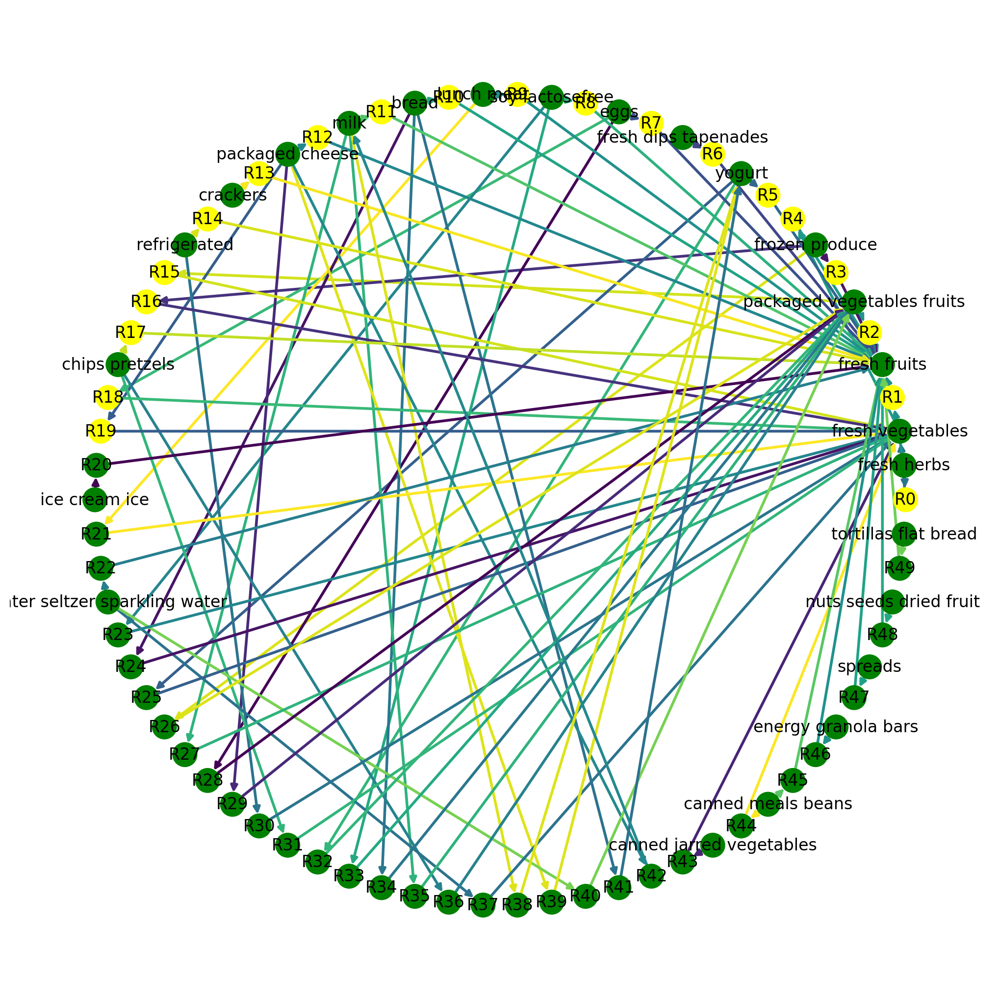

In [223]:
draw_graph(rules_format(cluster_rules), len(rules_format(cluster_rules)))

In [224]:
cluster_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
27,(fresh herbs),(fresh vegetables),0.093005,0.444360,0.078655,0.845707,1.903203,0.037327,3.601205,0.511357,0.765963,NaN,General,2
12,(fresh herbs),(fresh fruits),0.093005,0.555995,0.070135,0.754099,1.356306,0.018425,1.805627,0.440121,0.799824,NaN,General,2
21,(packaged vegetables fruits),(fresh fruits),0.365415,0.555995,0.269870,0.738530,1.328304,0.066701,1.698112,0.611956,0.292507,NaN,General,2
15,(frozen produce),(fresh fruits),0.122580,0.555995,0.089235,0.727974,1.309317,0.021081,1.632213,0.444235,0.735424,NaN,General,2
13,(fresh vegetables),(fresh fruits),0.444360,0.555995,0.317560,0.714646,1.285346,0.070498,1.555978,0.642901,0.163497,NaN,General,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2,(bread),(packaged vegetables fruits),0.166395,0.360372,0.076710,0.461010,1.279262,0.016746,1.186716,0.336936,0.431006,-1.0,3,2
30,(milk),(packaged vegetables fruits),0.219520,0.360372,0.094745,0.431599,1.197647,0.015636,1.125310,0.347253,0.290328,-1.0,3,2
27,(water seltzer sparkling water),(fresh vegetables),0.177983,0.448915,0.075812,0.425951,0.948847,-0.004087,0.959998,0.297415,0.491633,-1.0,3,2
32,(milk),(yogurt),0.219520,0.262363,0.089195,0.406320,1.548691,0.031601,1.242481,0.373144,0.109102,-1.0,3,2


## Substitutes

In [225]:
substitutes_rules = cluster_rules[(cluster_rules.lift < 0.93)]
substitutes_rules.sort_values(by = 'confidence', ascending = True)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
212,(soy lactosefree),(milk),0.294435,0.416384,0.097378,0.330728,0.794286,-0.025220,0.872016,0.282297,0.198795,-1.0,0,2
227,(soy lactosefree),(packaged cheese),0.294435,0.471407,0.128342,0.435891,0.924660,-0.010457,0.937041,0.354072,0.277604,-1.0,0,2
196,(ice cream ice),(packaged vegetables fruits),0.193663,0.622995,0.112069,0.578682,0.928871,-0.008582,0.894823,0.379285,0.609337,-1.0,0,2
155,(frozen meals),(fresh vegetables),0.146381,0.705030,0.092124,0.629347,0.892653,-0.011079,0.795811,0.380007,0.735756,-1.0,0,2
26,(breakfast bakery),(fresh vegetables),0.147427,0.705030,0.093519,0.634342,0.899738,-0.010421,0.806683,0.383494,0.734716,-1.0,0,2
44,(cereal),(fresh vegetables),0.191292,0.705030,0.122088,0.638231,0.905253,-0.012778,0.815353,0.405699,0.663544,-1.0,0,2
102,(energy granola bars),(fresh vegetables),0.177577,0.705030,0.115138,0.648383,0.919653,-0.010059,0.838895,0.405846,0.687263,-1.0,0,2
57,(chips pretzels),(fresh vegetables),0.337928,0.705030,0.220094,0.651304,0.923795,-0.018156,0.845921,0.481740,0.446127,-1.0,0,2
159,(instant foods),(fresh vegetables),0.127458,0.705030,0.083151,0.652380,0.925322,-0.006711,0.848540,0.385160,0.770777,-1.0,0,2
138,(soft drinks),(fresh fruits),0.126621,0.805058,0.087452,0.690655,0.857895,-0.014486,0.630176,0.399642,0.803618,-1.0,0,2


In [226]:
cluster_rules[(cluster_rules.lift < 0.93)][['antecedents','consequents','support','confidence','lift','IR','cluster']]

,antecedents,consequents,support,confidence,lift,IR,cluster
117,(frozen meals),(fresh fruits),0.109466,0.747816,0.928897,0.782303,0
135,(paper goods),(fresh fruits),0.078897,0.708412,0.879951,0.828249,0
138,(soft drinks),(fresh fruits),0.087452,0.690655,0.857895,0.803618,0
159,(instant foods),(fresh vegetables),0.083151,0.652380,0.925322,0.770777,0
57,(chips pretzels),(fresh vegetables),0.220094,0.651304,0.923795,0.446127,0
102,(energy granola bars),(fresh vegetables),0.115138,0.648383,0.919653,0.687263,0
44,(cereal),(fresh vegetables),0.122088,0.638231,0.905253,0.663544,0
26,(breakfast bakery),(fresh vegetables),0.093519,0.634342,0.899738,0.734716,0
155,(frozen meals),(fresh vegetables),0.092124,0.629347,0.892653,0.735756,0
196,(ice cream ice),(packaged vegetables fruits),0.112069,0.578682,0.928871,0.609337,0


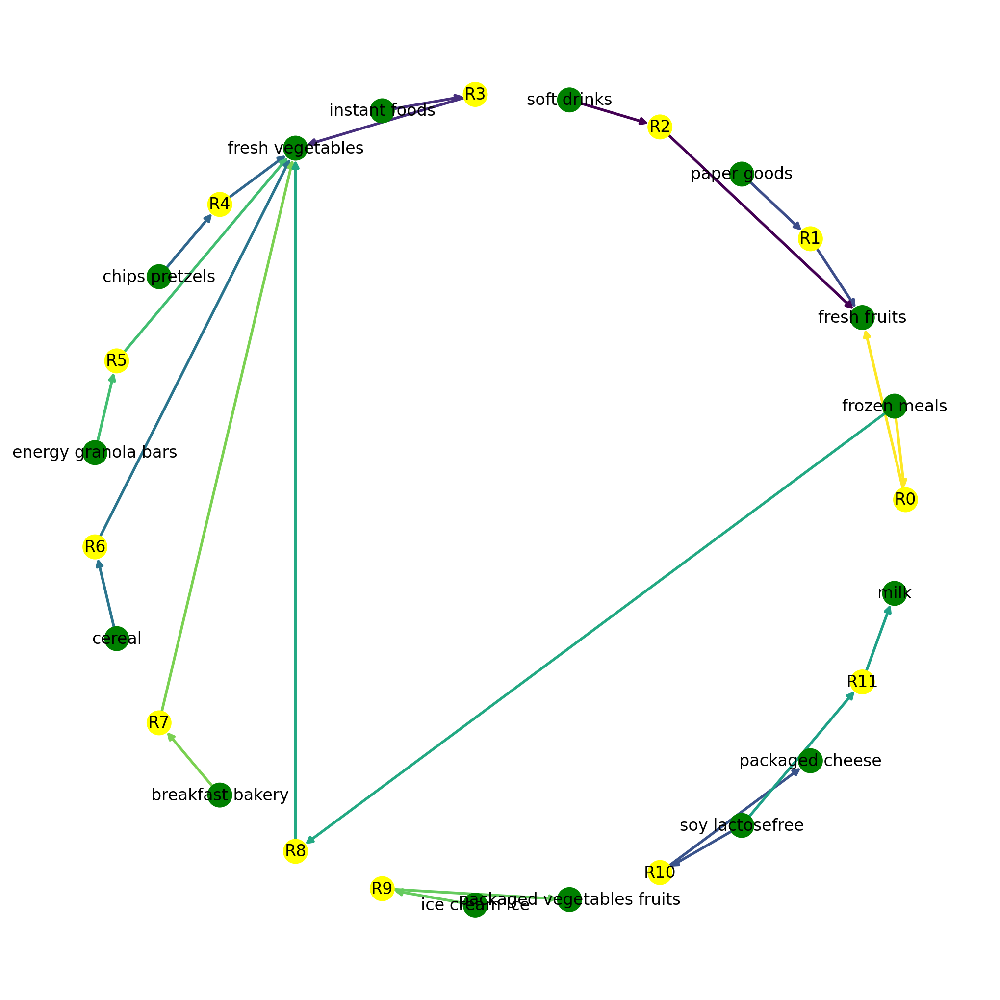

In [227]:
draw_graph(rules_format(substitutes_rules), len(rules_format(substitutes_rules)))

## Complementary

In [228]:
comp_rules = cluster_rules[(cluster_rules.lift > 1.5) & (cluster_rules.confidence > 0.4)]
comp_rules.sort_values(by = 'confidence', ascending = False)[['antecedents','consequents','support','confidence','lift','IR','cluster']]

,antecedents,consequents,support,confidence,lift,IR,cluster
19,(fresh herbs),(fresh vegetables),0.081688,0.853367,1.900957,0.762912,3
27,(fresh herbs),(fresh vegetables),0.078655,0.845707,1.903203,0.765963,General
12,(canned jarred vegetables),(fresh vegetables),0.074006,0.803466,1.504671,0.800372,General
18,(packaged vegetables fruits),(fresh vegetables),0.208051,0.628543,1.514207,0.156289,1
7,(packaged vegetables fruits),(fresh vegetables),0.143375,0.523275,1.500687,0.155837,2
100,(lunch meat),(packaged cheese),0.056161,0.453917,1.706226,0.426594,General
27,(crackers),(packaged cheese),0.050801,0.417917,1.570907,0.428983,General
32,(milk),(yogurt),0.089195,0.406320,1.548691,0.109102,3


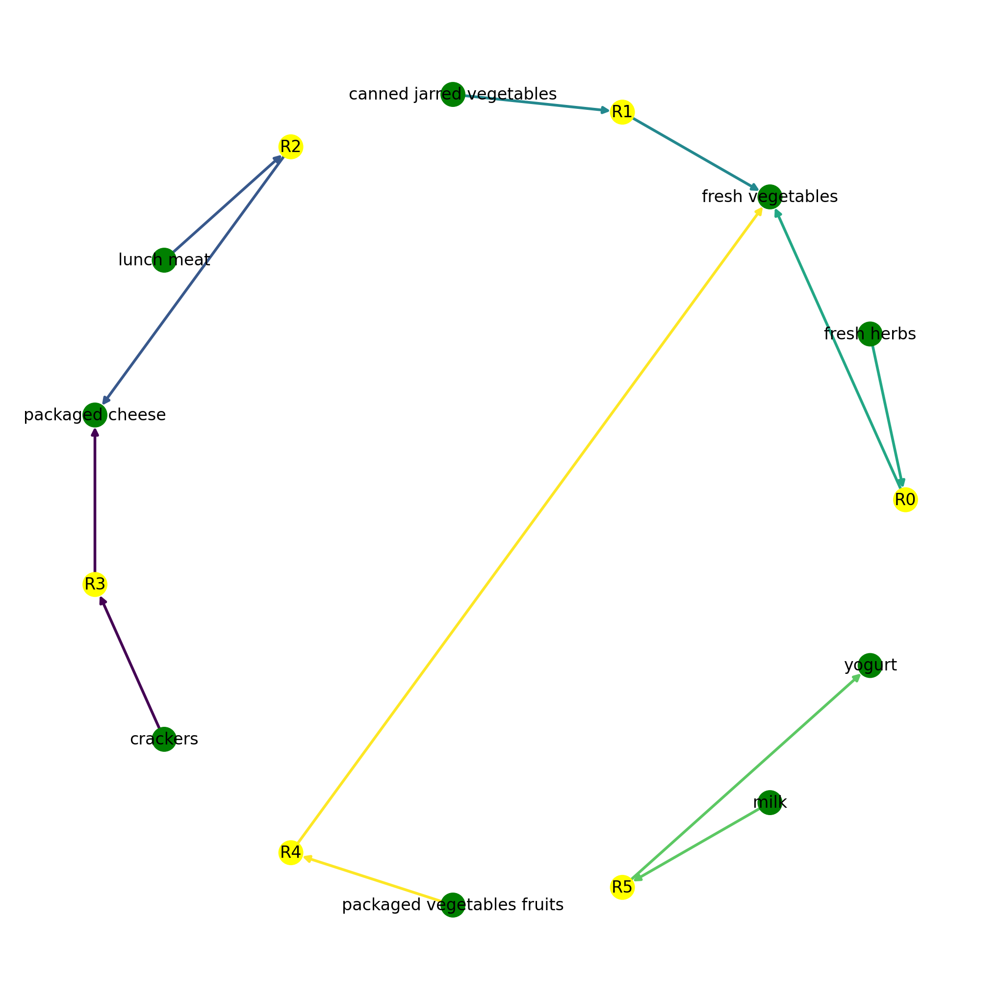

In [229]:
draw_graph(rules_format(comp_rules), len(rules_format(comp_rules)))

### Hidden Relationship

In [230]:
hidden_rules = cluster_rules[(cluster_rules.lift > 1.3) & (cluster_rules.IR > 0.6)]
hidden_rules.sort_values(by = 'lift', ascending = True )[0:20][['antecedents','consequents','support','confidence','lift','IR','cluster']]

,antecedents,consequents,support,confidence,lift,IR,cluster
29,(lunch meat),(fresh vegetables),0.060095,0.578448,1.301756,0.697463,General
149,(fresh herbs),(fresh vegetables),0.162978,0.917910,1.301944,0.733008,0
2,(eggs),(fresh fruits),0.085509,0.642774,1.306115,0.665425,1
11,(soy lactosefree),(fresh fruits),0.100224,0.643768,1.308133,0.614411,1
82,(oils vinegars),(fresh vegetables),0.050744,0.698861,1.308775,0.830034,General
15,(frozen produce),(fresh fruits),0.089235,0.727974,1.309317,0.735424,General
13,(canned jarred vegetables),(packaged vegetables fruits),0.052084,0.565460,1.321289,0.717654,General
33,(dry pasta),(fresh vegetables),0.062717,0.710824,1.331177,0.796698,General
90,(soup broth bouillon),(fresh vegetables),0.071925,0.711105,1.331703,0.768526,General
9,(frozen produce),(fresh fruits),0.091970,0.709251,1.334228,0.705992,3


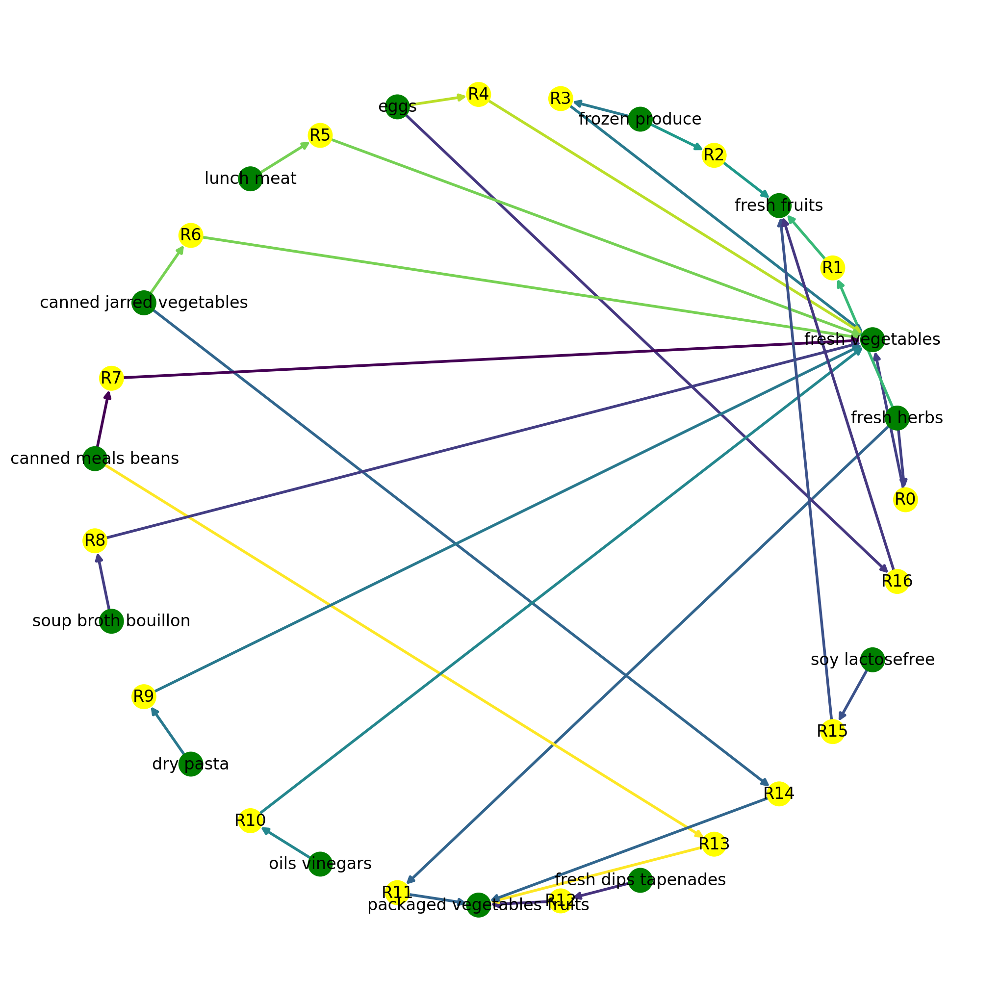

In [231]:
draw_graph(rules_format(hidden_rules), len(rules_format(hidden_rules)))

## Rules Exploration by cluster

## Product General Rules (Cluster == 'General')

### Hidden relationships

In [232]:
cluster_rules[(cluster_rules.cluster == 'General' ) & (cluster_rules.IR > 0.6) & (cluster_rules.lift > 1.3)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
27,(fresh herbs),(fresh vegetables),0.093005,0.444360,0.078655,0.845707,1.903203,0.037327,3.601205,0.511357,0.765963,NaN,General,2
12,(fresh herbs),(fresh fruits),0.093005,0.555995,0.070135,0.754099,1.356306,0.018425,1.805627,0.440121,0.799824,NaN,General,2
15,(frozen produce),(fresh fruits),0.122580,0.555995,0.089235,0.727974,1.309317,0.021081,1.632213,0.444235,0.735424,NaN,General,2
28,(frozen produce),(fresh vegetables),0.122580,0.444360,0.077750,0.634280,1.427400,0.023280,1.519303,0.404625,0.657781,NaN,General,2
9,(eggs),(fresh vegetables),0.136490,0.444360,0.084310,0.617701,1.390091,0.023659,1.453417,0.403717,0.620031,NaN,General,2
29,(lunch meat),(fresh vegetables),0.103890,0.444360,0.060095,0.578448,1.301756,0.013930,1.318083,0.356844,0.697463,NaN,General,2
12,(canned jarred vegetables),(fresh vegetables),0.092109,0.533981,0.074006,0.803466,1.504671,0.024822,2.371191,0.471030,0.800372,1.0,General,2
15,(canned meals beans),(fresh vegetables),0.091140,0.533981,0.070386,0.772287,1.446280,0.021719,2.046513,0.452050,0.798294,1.0,General,2
90,(soup broth bouillon),(fresh vegetables),0.101146,0.533981,0.071925,0.711105,1.331703,0.017915,1.613106,0.422901,0.768526,1.0,General,2
33,(dry pasta),(fresh vegetables),0.088232,0.533981,0.062717,0.710824,1.331177,0.015603,1.611539,0.414138,0.796698,1.0,General,2


### Complementary

In [233]:
cluster_rules[(cluster_rules.cluster == 'General' ) & (cluster_rules.lift > 1.5) & (cluster_rules.confidence > 0.4)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
27,(fresh herbs),(fresh vegetables),0.093005,0.444360,0.078655,0.845707,1.903203,0.037327,3.601205,0.511357,0.765963,NaN,General,2
12,(canned jarred vegetables),(fresh vegetables),0.092109,0.533981,0.074006,0.803466,1.504671,0.024822,2.371191,0.471030,0.800372,1.0,General,2
100,(lunch meat),(packaged cheese),0.123724,0.266036,0.056161,0.453917,1.706226,0.023245,1.344053,0.332509,0.426594,1.0,General,2
27,(crackers),(packaged cheese),0.121558,0.266036,0.050801,0.417917,1.570907,0.018462,1.260928,0.304437,0.428983,1.0,General,2


### Substitute

In [234]:
cluster_rules[(cluster_rules.cluster == 'General' ) & (cluster_rules.lift < 1)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
37,(water seltzer sparkling water),(fresh vegetables),0.193005,0.44436,0.083355,0.43188,0.971915,-0.002409,0.978033,0.309732,0.453701,NaN,General,2


## Cluster Weekly / Cluster 0

### Hidden relationships

In [235]:
cluster_rules[(cluster_rules.cluster == 0) & (cluster_rules.IR > 0.6) & (cluster_rules.lift > 1.3)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
149,(fresh herbs),(fresh vegetables),0.177554,0.70503,0.162978,0.91791,1.301944,0.037798,3.593265,0.574538,0.733008,-1.0,0,2


### Complementary

In [236]:
cluster_rules[(cluster_rules.cluster == 0 ) & (cluster_rules.lift > 1.5) & (cluster_rules.confidence > 0.4)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length


### Substitute

In [237]:
cluster_rules[(cluster_rules.cluster == 0 ) & (cluster_rules.lift < 0.93)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
117,(frozen meals),(fresh fruits),0.146381,0.805058,0.109466,0.747816,0.928897,-0.008379,0.773015,0.441894,0.782303,-1.0,0,2
135,(paper goods),(fresh fruits),0.111372,0.805058,0.078897,0.708412,0.879951,-0.010764,0.668551,0.403207,0.828249,-1.0,0,2
138,(soft drinks),(fresh fruits),0.126621,0.805058,0.087452,0.690655,0.857895,-0.014486,0.630176,0.399642,0.803618,-1.0,0,2
159,(instant foods),(fresh vegetables),0.127458,0.705030,0.083151,0.652380,0.925322,-0.006711,0.848540,0.385160,0.770777,-1.0,0,2
57,(chips pretzels),(fresh vegetables),0.337928,0.705030,0.220094,0.651304,0.923795,-0.018156,0.845921,0.481740,0.446127,-1.0,0,2
102,(energy granola bars),(fresh vegetables),0.177577,0.705030,0.115138,0.648383,0.919653,-0.010059,0.838895,0.405846,0.687263,-1.0,0,2
44,(cereal),(fresh vegetables),0.191292,0.705030,0.122088,0.638231,0.905253,-0.012778,0.815353,0.405699,0.663544,-1.0,0,2
26,(breakfast bakery),(fresh vegetables),0.147427,0.705030,0.093519,0.634342,0.899738,-0.010421,0.806683,0.383494,0.734716,-1.0,0,2
155,(frozen meals),(fresh vegetables),0.146381,0.705030,0.092124,0.629347,0.892653,-0.011079,0.795811,0.380007,0.735756,-1.0,0,2
196,(ice cream ice),(packaged vegetables fruits),0.193663,0.622995,0.112069,0.578682,0.928871,-0.008582,0.894823,0.379285,0.609337,-1.0,0,2


### Cluster Regular/Cluster 1

### Hidden Relationship

In [238]:
cluster_rules[(cluster_rules.cluster == 1) & (cluster_rules.IR > 0.6) & (cluster_rules.lift > 1.3)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
6,(frozen produce),(fresh fruits),0.113909,0.492127,0.078293,0.687330,1.396653,0.022235,1.624312,0.423211,0.716672,-1.0,1,2
11,(soy lactosefree),(fresh fruits),0.155684,0.492127,0.100224,0.643768,1.308133,0.023608,1.425679,0.423711,0.614411,-1.0,1,2
2,(eggs),(fresh fruits),0.133031,0.492127,0.085509,0.642774,1.306115,0.020041,1.421714,0.408264,0.665425,-1.0,1,2


### Complementary

In [239]:
cluster_rules[(cluster_rules.cluster == 1 ) & (cluster_rules.lift > 1.5) & (cluster_rules.confidence > 0.4)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
18,(packaged vegetables fruits),(fresh vegetables),0.331005,0.415097,0.208051,0.628543,1.514207,0.070652,1.574617,0.564877,0.156289,-1.0,1,2


### Substitute

In [240]:
cluster_rules[(cluster_rules.cluster == 1 ) & (cluster_rules.lift < 0.93)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length


### Cluster Sporadic / Cluster 2

### Hidden relationship

In [241]:
cluster_rules[(cluster_rules.cluster == 2) & (cluster_rules.IR > 0.6) & (cluster_rules.lift > 1.3)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length


### Complementary

In [242]:
cluster_rules[(cluster_rules.cluster == 2) & (cluster_rules.lift > 1.5) & (cluster_rules.confidence > 0.4)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
7,(packaged vegetables fruits),(fresh vegetables),0.273996,0.34869,0.143375,0.523275,1.500687,0.047835,1.366216,0.467228,0.155837,-1.0,2,2


### Substitute

In [243]:
cluster_rules[(cluster_rules.cluster == 2 ) & (cluster_rules.lift < 0.93)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length


### Cluster Newbbies / Cluster 3

### Hidden relationship

In [244]:
cluster_rules[(cluster_rules.cluster == 3) & (cluster_rules.IR > 0.6) & (cluster_rules.lift > 1.3)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
19,(fresh herbs),(fresh vegetables),0.095724,0.448915,0.081688,0.853367,1.900957,0.038716,3.758274,0.517667,0.762912,-1.0,3,2
9,(frozen produce),(fresh fruits),0.129672,0.531582,0.091970,0.709251,1.334228,0.023039,1.611076,0.441132,0.705992,-1.0,3,2
20,(frozen produce),(fresh vegetables),0.129672,0.448915,0.085115,0.656388,1.462166,0.026903,1.603800,0.422995,0.646932,-1.0,3,2
6,(eggs),(fresh vegetables),0.134813,0.448915,0.083483,0.619249,1.379437,0.022963,1.447366,0.402608,0.627896,-1.0,3,2


### Complementary

In [245]:
cluster_rules[(cluster_rules.cluster == 2) & (cluster_rules.lift > 1.5) & (cluster_rules.confidence > 0.4)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
7,(packaged vegetables fruits),(fresh vegetables),0.273996,0.34869,0.143375,0.523275,1.500687,0.047835,1.366216,0.467228,0.155837,-1.0,2,2


### Substitute

In [246]:
cluster_rules[(cluster_rules.cluster == 2 ) & (cluster_rules.lift < 0.93)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,Kulc,IR,Day,cluster,length
